# Differential testing to identify molecular disruptions upon Eomes KD

In [1]:
here::i_am("rna_atac/differential/differential.ipynb")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(edgeR))


BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 16

# Multi core using future - built in to seurat
plan("multicore", workers = 16)
options(future.globals.maxSize = 50 * 1024 ^ 3) # for 50 Gb RAM

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/code



In [2]:
args = list()

# Metadata
args$metadata = file.path(io$basedir, 'results/rna_atac/clustering/metadata_mofa_clusters.txt.gz')
args$d45_annotations =  file.path(io$basedir, 'results/rna_atac/clustering/d45_celltypes.txt.gz')
args$early_annotations =  file.path(io$basedir, 'results/rna_atac/clustering/early_celltypes.txt.gz')

args$MOFA_factors = file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/mofa/MOFA_factors.txt.gz')
args$MOFA_umap = file.path(io$basedir, 'results/rna_atac/dimensionality_reduction/mofa/MOFA_umap.txt.gz')

# RNA_sce
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')

args$logFC_thr = 0.25
args$FDR_thr = 0.05

# outdir
args$outdir = file.path(io$basedir, 'results/rna_atac/differential/v2/expression/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

In [3]:
# Load meta
meta = fread(args$metadata)[day!='D2.5']

early_annotations = fread(args$early_annotations)
d45_annotations = fread(args$d45_annotations)

In [4]:
head(d45_annotations)

cell,celltype_manual
<chr>,<chr>
RBG43477#AAACAGCCAACACCTA-1,Ectoderm-like
RBG43477#AAACAGCCAATGAAGC-1,Somitic Mesoderm
RBG43477#AAACAGCCAGCATTAT-1,Paraxial Mesoderm
RBG43477#AAACAGCCAGGAAGCC-1,Ectoderm-like
RBG43477#AAACAGCCATGGAGGC-1,Somitic Mesoderm
RBG43477#AAACATGCAAGTAAGC-1,Somitic Mesoderm


In [5]:
meta$celltype_manual = ifelse(meta$day == 'D3', 
                              early_annotations[match(meta$cell, cell), celltype_manual],
                              d45_annotations[match(meta$cell, cell), celltype_manual])

In [6]:
table(meta$celltype_manual, meta$genotype)

                    
                     Eomes_KO   WT
  DE/Gut                    6  819
  Ectoderm-like           893  452
  Epiblast                468  190
  Notochord                67 1630
  Paraxial Mesoderm      2961  402
  PGC                     155  259
  PS 1                   8217 2196
  PS 2                   4620 1987
  PS 3                   3360 1600
  PS Eomes-dependent       30 1962
  Somitic Mesoderm       3025 1083
  unknown                 273  120

## Load Data

In [7]:
# load sce
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = TRUE, cells = meta$cell)
colData(rna.sce) = meta %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()

# Convert to Seurat
seurat = as.Seurat(rna.sce)

In [8]:
mofa_umap = fread(args$MOFA_umap)[match(meta$cell, cell)]

In [9]:
# Prepare mofa umap
umap.mtx = mofa_umap[,c('cell', 'UMAP1', 'UMAP2')] %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()
seurat[["umap"]] <- CreateDimReducObject(embeddings = umap.mtx, key = "umap_", assay = DefaultAssay(seurat))

In [10]:
Idents(seurat) = seurat@meta.data$genotype

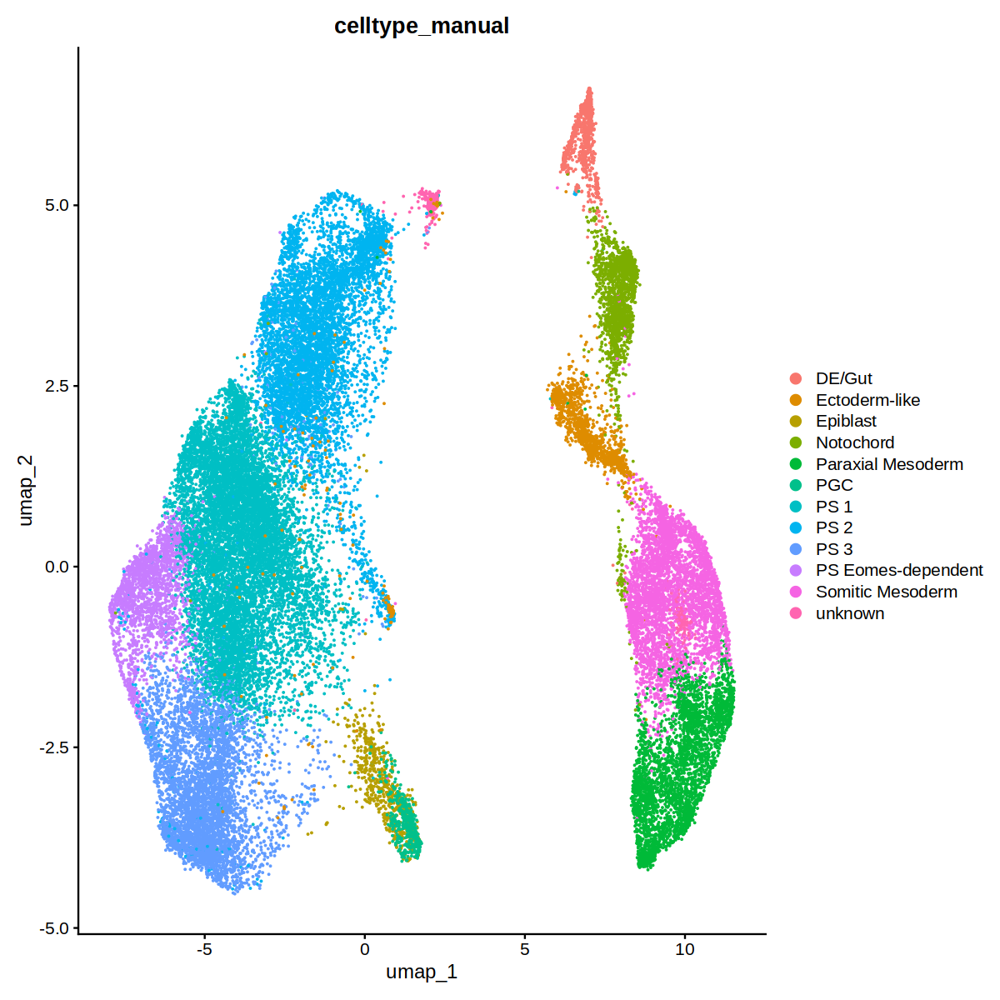

In [11]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(
  seurat,
  group.by = 'celltype_manual')

## Celltype differential expression

### D3 - EdgeR (2 replicates)

In [720]:
### Differential testing functinos
volcano_plot = function(dt, ntop=5, logFC_thr = logFC_thr, FDR_thr = FDR_thr, xlim=2, ylim=40, title=NULL){
    tmp = dt[,sign:=ifelse(padj_fdr < FDR_thr & abs(logFC) > logFC_thr, ifelse(logFC>0, 'pos', 'neg'), 'nonsig')] %>%
        .[order(-abs(logFC))] %>% 
        .[,logFC_plot:=ifelse(logFC<=-xlim, -xlim, ifelse(logFC>=xlim, xlim, logFC))] %>%
        .[,log10_padj_fdr:=ifelse(-log10(padj_fdr)>=ylim, ylim, -log10(padj_fdr))]
    
    labels = tmp[, head(.SD, ntop),  by=sign][sign!='nonsig']
    
    negative_hits <- tmp[sign == 'neg',gene]
    positive_hits <- tmp[sign == 'pos',gene]
    all <- nrow(tmp[!is.na(sign)])
    
    p = ggplot(tmp, aes(logFC_plot, log10_padj_fdr, col=sign, size = sign)) + 
        geom_point() + 
        scale_colour_manual(values=c('pos' = 'red', 'neg' = 'blue', 'nonsig' = 'black')) + 
        scale_size_manual(values=c('pos' = 1, 'neg' = 1, 'nonsig' = 0.2)) + 
        geom_vline(xintercept=c(-logFC_thr, logFC_thr),  linetype = "longdash") +
        geom_segment(aes(x=0, xend=0, y=0, yend=ylim*1.05), color="orange", linewidth=0.5) +
        geom_hline(yintercept=-log10(FDR_thr),  linetype = "longdash") + 
        ggrepel::geom_text_repel(data=labels, aes(label=gene), 
                                 color='black',
                                 size=5,
                                 box.padding = 0.5, 
                                 max.overlaps = Inf,
                                 bg.color='white', 
                                 bg.r = 0.1) + 
        scale_x_continuous(limits=c(-xlim*1.05,xlim*1.05), expand = c(0,0)) +
        scale_y_continuous(limits=c(0,ylim*1.2), expand = c(0,0)) +
        annotate("text", x=0, y=ylim*1.1, size=6, label=sprintf("(%d)", all)) +
        annotate("text", x=-xlim*0.9, y=ylim*1.15, size=6, label=sprintf("%d (-)",length(negative_hits))) +
        annotate("text", x=xlim*0.9, y=ylim*1.15, size=6, label=sprintf("%d (+)",length(positive_hits))) +
        #xlim(c(-max(abs(tmp$logFC)), max(abs(tmp$logFC)))) + 
        ggtitle(title) + 
        theme_bw() + 
        theme(text = element_text(size=15, color='black'),
             axis.text = element_text(size=15, color='black'),
             legend.position = 'none',
              plot.title = element_text(hjust=0.5))
    
    return(p)
}

run_edger = function(fr_cells = fr_cells, bg_cells = bg_cells, logFC_thr = logFC_thr, title = ''){
    sce = rna.sce[, c(bg_cells, fr_cells)]
    sce$group = ifelse(colnames(sce) %in% fr_cells, 'fr', 'bg') 
    sce$group_by = paste0(sce$group, '_', sce$sample)   
    
    sce = aggregateAcrossCells(sce, id=sce$group_by, BPPARAM = BPPARAM)
    
    # Convert SCE to DGEList
    sce_edger <- scran::convertTo(sce, type="edgeR")

    keep.genes <- filterByExpr(sce_edger, group=sce_edger$samples$group, min.count = 50, min.total.count = 200)
    sce_edger = sce_edger[keep.genes, ]

    # Calculate Normalisation Factors
    sce_edger <- calcNormFactors(sce_edger)

    # Define design matrix (with intercept)
    design <- model.matrix(~sce$group)

    # Estimate dispersions
    sce_edger  <- estimateDisp(sce_edger,design)

    # Fit GLM
    fit <- glmQLFit(sce_edger,design)

    # Likelihood ratio test
    lrt <- glmQLFTest(fit)

    # Testing above logFC threshold
    lrt = glmTreat(fit, lfc=logFC_thr)

    # Construct output data.frame
    out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
    setnames(c("gene","logFC","logCPM","LR","p.value","padj_fdr"))
    
    plot = volcano_plot(out,ylim = 10, FDR_thr = 0.05, logFC_thr = logFC_thr, ntop = 10, title = title)
    
    tmp = list(out, plot)
    names(tmp) = c('DEGs', 'plot')
    return(tmp)
}



find_DEGs = function(celltype_test, logFC_thr = args$logFC_thr, test = 'wilcox', sample_cells = NULL, plot = T){
    title = celltype_test
    message(celltype_test)
    tmp = seurat[, meta[celltype_manual %in% celltype_test]$cell]

    KO_tmp = tmp[,tmp$genotype == 'Eomes_KO']
    WT_tmp = tmp[,tmp$genotype == 'WT']
    
    if(!is.null(sample_cells)){
        KO_tmp = KO_tmp[,sample(colnames(KO_tmp), sample_cells)]
        WT_tmp = WT_tmp[,sample(colnames(WT_tmp), sample_cells)]
    }
    
    fr_cells = colnames(KO_tmp)
    bg_cells = colnames(WT_tmp)
    
    tmp = run_edger(fr_cells = fr_cells, bg_cells = bg_cells, logFC_thr = logFC_thr, title = title)
    if(plot){
        return(tmp$plot)
    }
    else{return(tmp$DEGs)}
}  

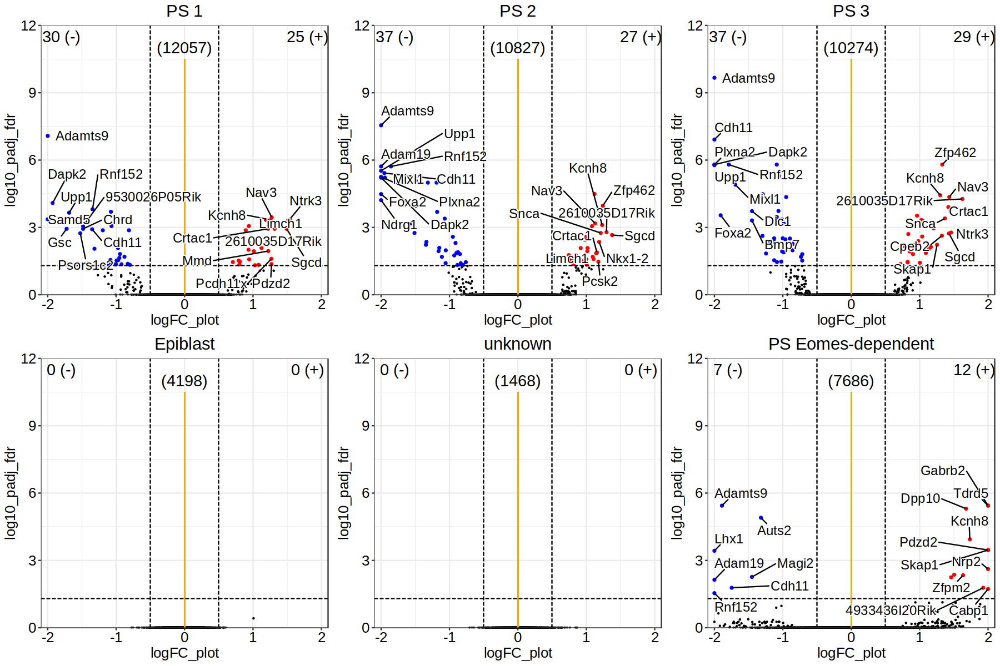

In [612]:
plots = mclapply(unique(meta[day == 'D3', celltype_manual]), function(x){
    tmp = find_DEGs(celltype_test = x, logFC = 0.5)
    return(tmp)
}, mc.cores = 8)
options(repr.plot.width=15, repr.plot.height=10)
ggarrange(plotlist=plots)

In [613]:
DEGs = mclapply(unique(meta[day == 'D3', celltype_manual]), function(x){
    tmp = find_DEGs(celltype_test = x, plot=F, logFC = 0.5)
    return(tmp)
}, mc.cores = 12) %>% rbindlist()

In [614]:
fwrite(DEGs, sprintf('%s/celltype_DEGs_edgeR.txt.gz', args$outdir))

PS 1PS 2PS 3



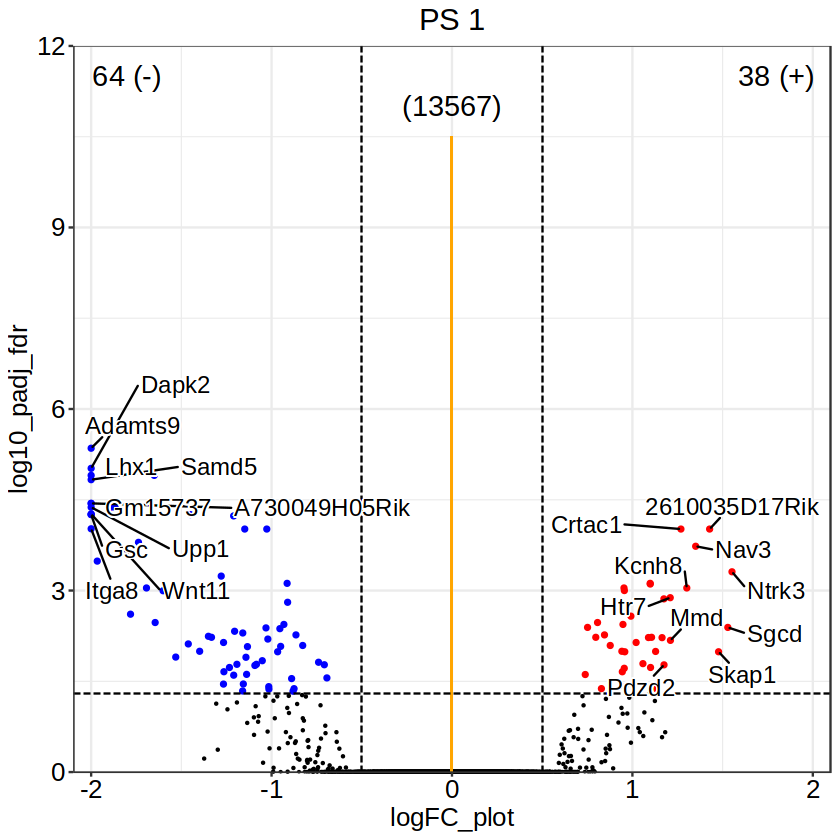

In [615]:
options(repr.plot.width=7, repr.plot.height=7)
find_DEGs(celltype_test = c('PS 1', 'PS 2', 'PS 3'), logFC = 0.5)

In [616]:
DEGs = find_DEGs(celltype_test = c('PS 1', 'PS 2', 'PS 3'), logFC = 0.5, plot = F)
fwrite(DEGs, sprintf('%s/celltype_DEGs_allPS_edgeR.txt.gz', args$outdir))

PS 1PS 2PS 3



In [617]:
# Between WT PS and Eo-dependent PS
bg_cells = meta[genotype == 'WT' &
                            celltype_manual %in% c(paste0('PS ', 1:3)), 
                      cell]
fr_cells = meta[celltype_manual %in% 'PS Eomes-dependent' & genotype == 'WT', cell]

options(repr.plot.width = 7, repr.plot.height = 7)
DEGs = run_edger(bg_cells = bg_cells, fr_cells = fr_cells, logFC = 0.5)
fwrite(DEGs$DEGs, sprintf('%s/celltype_DEGs_WTPS_edgeR.txt.gz', args$outdir))

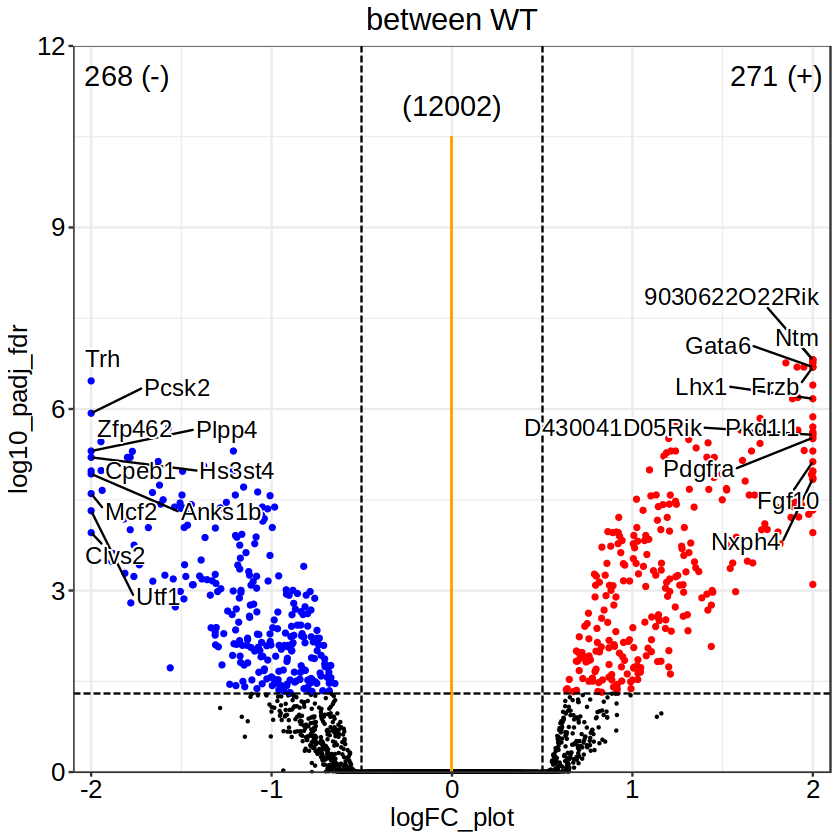

In [618]:
options(repr.plot.width=7, repr.plot.height=7)

volcano_plot(DEGs$DEGs,ylim = 10, FDR_thr = 0.05, logFC_thr = 0.5, ntop = 10, title = 'between WT')

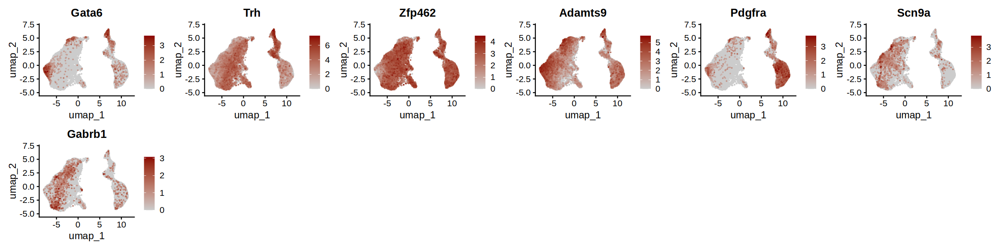

In [619]:
features = c('Gata6', 'Trh', 'Zfp462', 'Adamts9', 'Pdgfra', 'Scn9a', 'Gabrb1')

options(repr.plot.width=20, repr.plot.height=5)
FeaturePlot(seurat, 
            features = features, 
            cols = c('grey80', 'darkred'),
            ncol = 6,
            order = T)

In [620]:
withinPS = fread(sprintf('%s/celltype_DEGs_allPS_edgeR.txt.gz', args$outdir))#[sign != 'nonsig']
betweenPS = fread(sprintf('%s/celltype_DEGs_WTPS_edgeR.txt.gz', args$outdir))#[sign != 'nonsig']

In [623]:
merge = merge(withinPS %>%
                    .[, .(gene, logFC, padj_fdr)] %>% 
                    setnames(c('logFC', 'padj_fdr'), c('logFC_within', 'padj_fdr_within')),
                betweenPS %>%
                    .[, .(gene, logFC, padj_fdr)] %>% 
                    setnames(c('logFC', 'padj_fdr'), c('logFC_between', 'padj_fdr_between')),
              by = 'gene', all = T) %>% 
                .[, minFDR := pmin(padj_fdr_within, padj_fdr_between)]

merge[, c(2,4)][is.na(merge[, c(2,4)])] <- 0
merge[, c(3,5)][is.na(merge[, c(3,5)])] <- 1

merge = merge %>% 
                .[, minFDR := pmin(padj_fdr_within, padj_fdr_between)] %>% 
                .[, maxFDR := pmax(padj_fdr_within, padj_fdr_between)] %>% 
                .[, meanlogFC := rowMeans(abs(.SD), na.rm = TRUE), .SDcols = c("logFC_within", "logFC_between")]



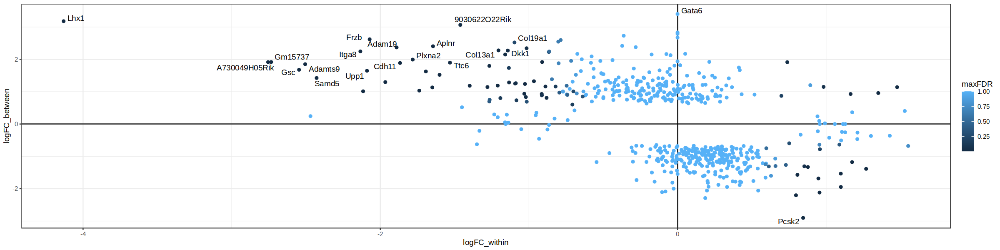

In [624]:
ggplot(merge[minFDR < 0.05], aes(logFC_within, logFC_between, color = maxFDR)) + 
    geom_hline(yintercept = 0) + 
    geom_vline(xintercept = 0) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(merge[minFDR < 0.05][order(-meanlogFC)], 20),
                             aes(label = gene),
                             color = 'black') + 
    theme_bw()

### Seurat - for D4.5 (only 1 replicate)

In [625]:
find_DEGs_seurat = function(celltype_test, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, test = 'wilcox', sample_cells = NULL){
    message(celltype_test)
    tmp = seurat[, meta[celltype_manual%in%celltype_test]$cell]
    if(!is.null(sample_cells)){
     KO_tmp = tmp[,tmp$genotype == 'Eomes_KO']
     KO_tmp = KO_tmp[,sample(colnames(KO_tmp), sample_cells)]

     WT_tmp = tmp[,tmp$genotype == 'WT']
     WT_tmp = WT_tmp[,sample(colnames(WT_tmp), sample_cells)]
    
     tmp = merge(KO_tmp, WT_tmp)
    }
    
    markers_tmp = FindMarkers(tmp, ident.1 = "Eomes_KO", ident.2 = "WT",
      logfc.threshold = logFC_thr, test.use = test)
    if(nrow(markers_tmp)>0){
        tmp = as.data.table(markers_tmp, keep.rownames=T) %>%
            setnames('rn', 'gene') %>% 
            .[,sig:=ifelse(p_val_adj <= FDR_thr, TRUE, FALSE)] %>% 
            .[,celltype:=paste(celltype_test, collapse = '/')]
        return(tmp)
    }
}  

# volcano plot
volcano_plot_seurat = function(dt, ntop=5, logFC_thr = args$logFC_thr, FDR_thr = args$FDR_thr, title=NULL){
    tmp = dt[,sign:=ifelse(p_val_adj < FDR_thr & abs(avg_log2FC) > logFC_thr, ifelse(avg_log2FC>0, 'pos', 'neg'), 'nonsig')] %>%
        .[order(p_val_adj)] #(-abs(avg_log2FC))]
    labels = tmp[, head(.SD, ntop),  by=sign][sign!='nonsig']
    
    negative_hits <- tmp[sign == 'neg',gene]
    positive_hits <- tmp[sign == 'pos',gene]
    all <- nrow(tmp[!is.na(sign)])
    
    ylim = max(-log10(tmp$p_val_adj))
    xlim = max(abs(tmp$avg_log2FC))
    
    p = ggplot(tmp, aes(avg_log2FC, -log10(p_val_adj), col=sign)) + 
        geom_point() +  
        scale_colour_manual(values=c('pos' = 'red', 'neg' = 'blue', 'nonsig' = 'black')) + 
        geom_vline(xintercept=c(-logFC_thr, logFC_thr),  linetype = "longdash") +
        geom_vline(xintercept=0, color='orange', linetype = "longdash") +
        geom_hline(yintercept=-log10(FDR_thr),  linetype = "longdash") + 
        ggrepel::geom_text_repel(data=labels, aes(label=gene), 
                                 color='black',
                                 size=5,
                                 box.padding = 0.5, 
                                 max.overlaps = Inf,
                                 bg.color='white', 
                                 bg.r = 0.1) + 
        # ylim(c(0, ylim*1.2)) + 
        annotate("text", x=0, y=ylim*1.1, size=6, label=sprintf("(%d)", all)) +
        annotate("text", x=-xlim*0.9, y=ylim*1.15, size=6, label=sprintf("%d (-)",length(negative_hits))) +
        annotate("text", x=xlim*0.9, y=ylim*1.15, size=6, label=sprintf("%d (+)",length(positive_hits))) +
        xlim(c(-max(abs(tmp$avg_log2FC)), max(abs(tmp$avg_log2FC)))) + 
        ggtitle(title) + 
        theme_bw() + 
        theme(text = element_text(size=15, color='black'),
             axis.text = element_text(size=15, color='black'),
             legend.position = 'none',
             plot.title = element_text(hjust=0.5))

    
    return(p)
}

In [626]:
keep = unique(meta[day == 'D4.5', celltype_manual])

In [627]:
args$logFC_thr = 0.5

In [628]:
DEGs = mclapply(keep, find_DEGs_seurat, mc.cores=1) %>% rbindlist()

Ectoderm-like

Somitic Mesoderm

Paraxial Mesoderm

PGC

Warning message in FindMarkers.default(object = data.use, slot = data.slot, counts = counts, :
“No features pass logfc.threshold threshold; returning empty data.frame”
unknown

Notochord

DE/Gut



In [629]:
fwrite(DEGs, sprintf('%s/DEGs_seurat.txt.gz', args$outdir))

In [630]:
plots = mclapply(keep, function(x){
    tmp = DEGs[celltype==x]
    p = volcano_plot_seurat(tmp, ntop=10, title=x)
    return(p)
}, mc.cores = 8)

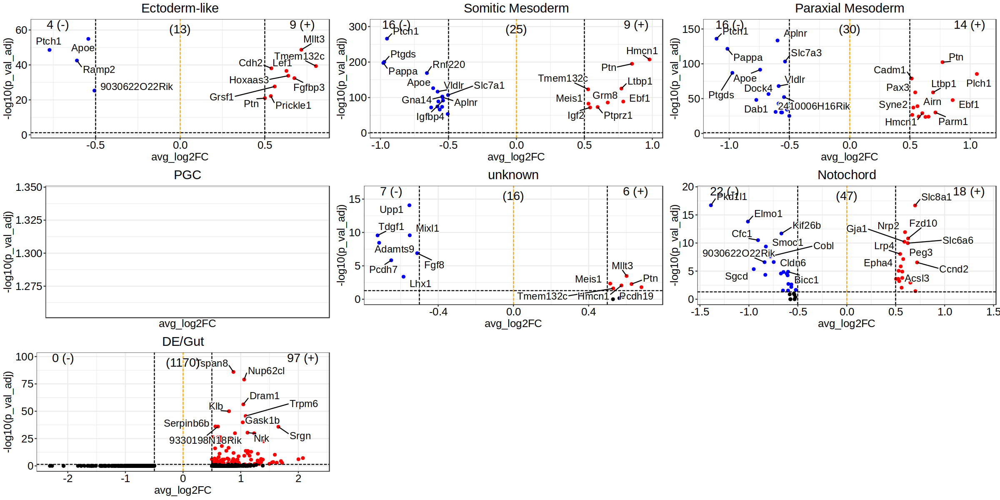

In [631]:
options(repr.plot.width=20, repr.plot.height=10)
ggarrange(plotlist=plots)

## Identify KD depleted regions

In [19]:
factors = fread(args$MOFA_factors)[cell %in% meta[day == 'D3', cell]]
factors.mtx = factors %>% 
    as.data.frame(.) %>% 
    tibble::column_to_rownames('cell') %>%
    as.matrix()

In [20]:
meta = fread(args$metadata)
meta = meta[day == 'D3']
meta$celltype_manual = ifelse(meta$day == 'D3', 
                              early_annotations[match(meta$cell, cell), celltype_manual],
                              d45_annotations[match(meta$cell, cell), celltype_manual])

meta = meta[!celltype_manual %in% c('Epiblast', 'unknown')]
factors.mtx = factors.mtx[meta$cell,]

In [21]:
neighbors = BiocNeighbors::findKNN(factors.mtx, 100, BPPARAM = BPPARAM)

In [22]:
day_props = meta %>% copy() %>%
    .[,Ntot := .N, by = c('day', 'genotype')] %>% 
    .[,c('day', 'genotype', 'Ntot')] %>% 
    dcast(day~genotype, value.var = 'Ntot') %>% 
    .[,ratio := Eomes_KO/(Eomes_KO+WT)]

id_gt = meta %>% copy() %>% 
    .[,c('genotype', 'day')] %>% 
    .[,cell:=.I]

pseudocount = 1
 
DA = mclapply(1:nrow(meta), function(x){ # nrow(meta)
    print(x)
    tmp = data.table(cell = as.vector(neighbors$index[x,])) %>% 
        merge(., id_gt, by = 'cell')
    
    tmp1 = tmp %>% copy() %>% .[,N := .N, by = 'day'] %>% unique(by = 'day') %>% 
        merge(., day_props[,c('day', 'ratio')], by = 'day') %>% 
        .[, N_ratio := ratio * N]
    
    global_ratio = sum(tmp1$N_ratio)/sum(tmp1$N)

    pvalue = binom.test(nrow(tmp[genotype == 'Eomes_KO']), nrow(tmp), p = global_ratio,
           alternative = "two.sided",
           conf.level = 0.95)$p.value

    tmp2 = data.table(cell = x,
                     # ratio = log2((nrow(tmp[genotype == 'KO']) + pseudocount) / (nrow(tmp[genotype == 'WT']) + pseudocount)),
                      ratio = nrow(tmp[genotype == 'Eomes_KO']) / (nrow(tmp[genotype == 'Eomes_KO']) + nrow(tmp[genotype == 'WT'])),
                      global_ratio = global_ratio,
                      pvalue = pvalue)
}, mc.cores = 16) %>% rbindlist() %>%
    .[,cell := meta$cell]

Aggregate function missing, defaulting to 'length'



In [24]:
meta3 = merge(meta, DA, by = 'cell')

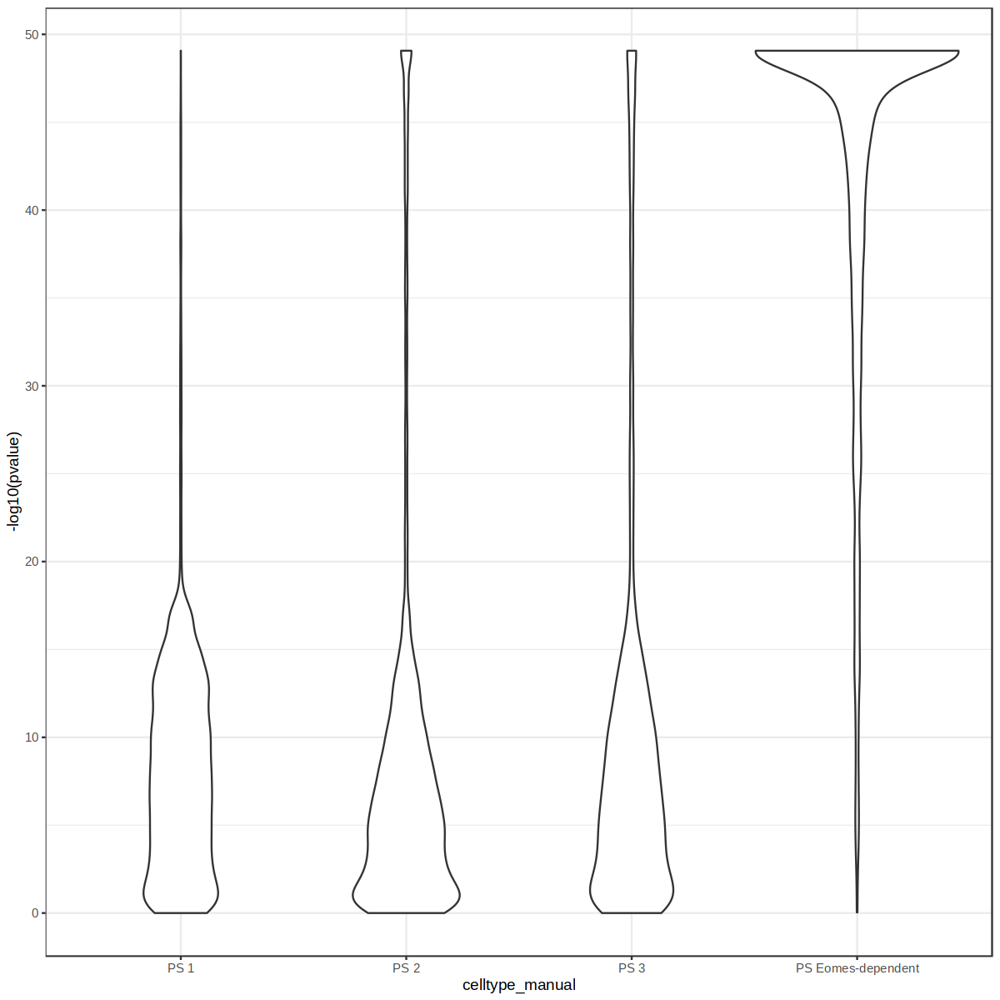

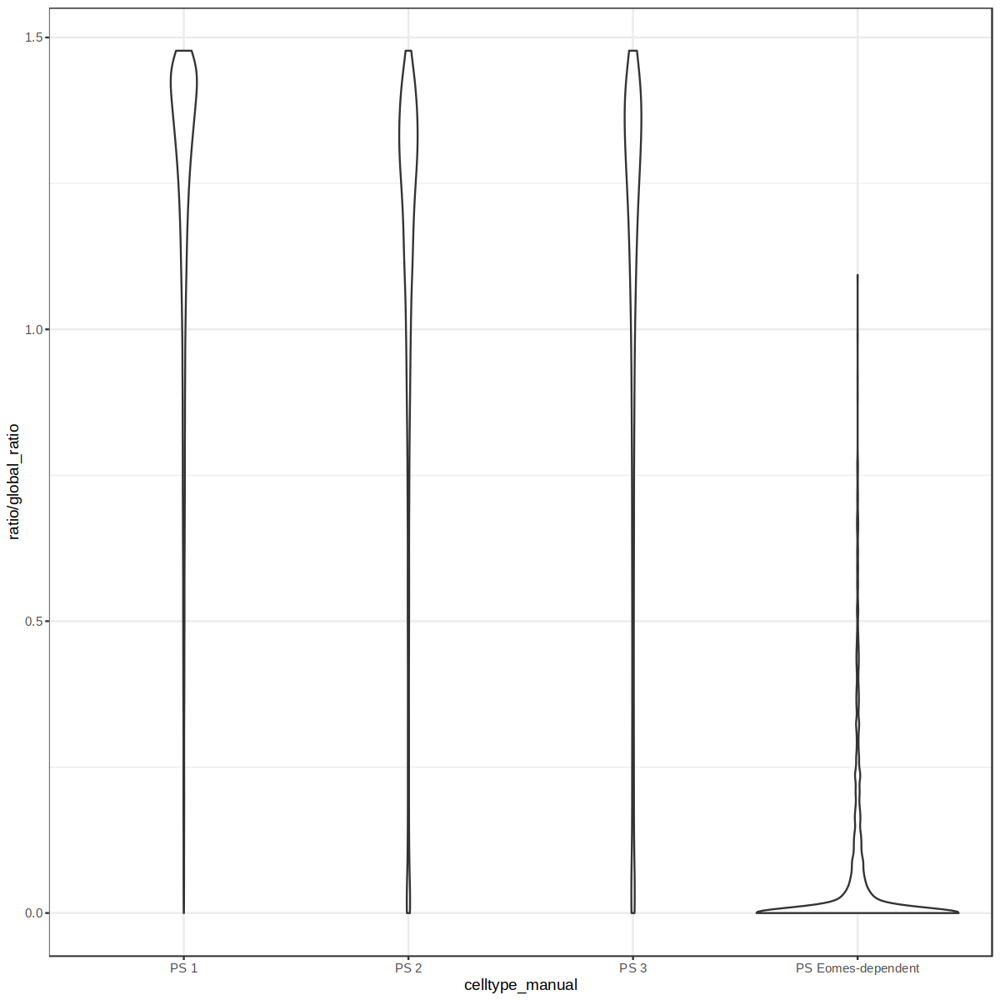

In [25]:
ggplot(meta3, aes(celltype_manual, -log10(pvalue))) + geom_violin() + theme_bw()
ggplot(meta3, aes(celltype_manual, ratio/global_ratio)) + geom_violin() + theme_bw() 

In [26]:
meta3 = meta3[, Eo_depleted := ifelse(pvalue < 1e-20, TRUE, FALSE)]

In [31]:
meta3 = cbind(meta3, umap.mtx[meta3$cell,]) 

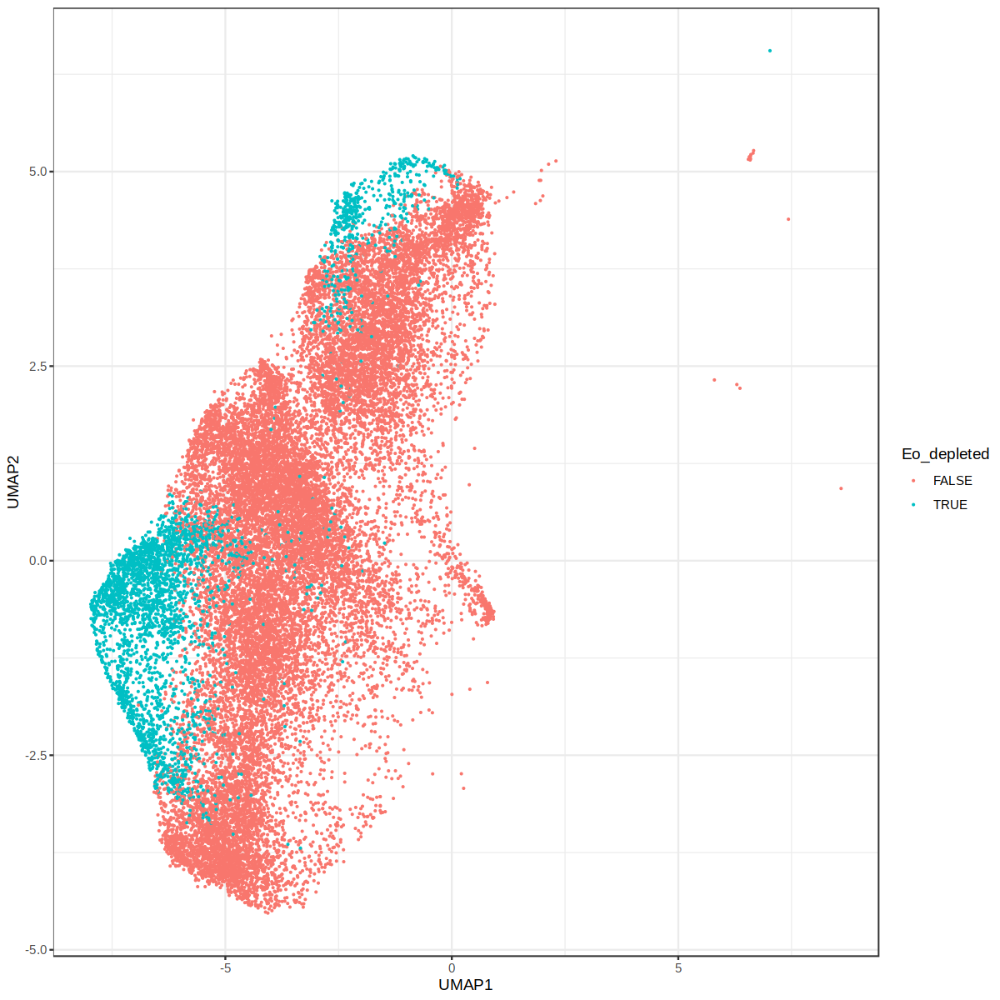

In [32]:
ggplot(meta3, aes(UMAP1, UMAP2, color = Eo_depleted)) + 
    geom_point(size = 0.1) + 
    theme_bw()

# RNA

In [35]:
# Get nearest cells

unique_NN = function(mat, ratio = 1){
    nrcells <- dim(mat)[1]

    # Initialize an empty vector to store unique values
    unique_values <- c()

    # Initialize a logical vector to track processed rows
    processed_rows <- rep(0, nrow(mat))  # Changed to 0 to track the count of unique values per row

    # Loop through each row
    for (row in 1:nrow(mat)) {

      # Go through the columns of the current row
      for (col in 1:ncol(mat)) {

        # Check if we have already taken 2 unique values from this row
        if (processed_rows[row] < ratio) {

          # Get the value from the current cell
          value <- mat[row, col]

          # If the value is not already in the unique_values vector, add it
          if (!value %in% unique_values) {

            unique_values <- c(unique_values, value)
            processed_rows[row] <- processed_rows[row] + 1  # Increment the count of unique values from this row

            # Stop if we have found `2 * nrcells` unique values (since we need 2 per row)
            if (length(unique_values) == ratio * nrcells) {
              break
            }
          }
        }
      }

      # Stop if we already have `ratio * nrcells` unique values
      if (length(unique_values) == ratio * nrcells) {
        break
      }
    }

    # Print the number of rows in the matrix and the length of the unique_values vector
    nrow(mat)
    length(unique_values)
    
    return(unique_values)
    
}

### Comparison to nearest WT cells

In [750]:
background = factors.mtx[meta3[Eo_depleted != TRUE & 
                            genotype == 'WT',
                      cell],]
query = factors.mtx[meta3[Eo_depleted == TRUE & genotype == 'WT', cell],]

In [751]:
NN = BiocNeighbors::queryKNN(background,
         query = query,
         k = 100)

In [752]:
bg_cells = rownames(background)[unique_NN(NN$index, ratio = 2)]
fr_cells = rownames(query)

In [753]:
length(bg_cells)
length(fr_cells)

[1] 3385

[1] 3274

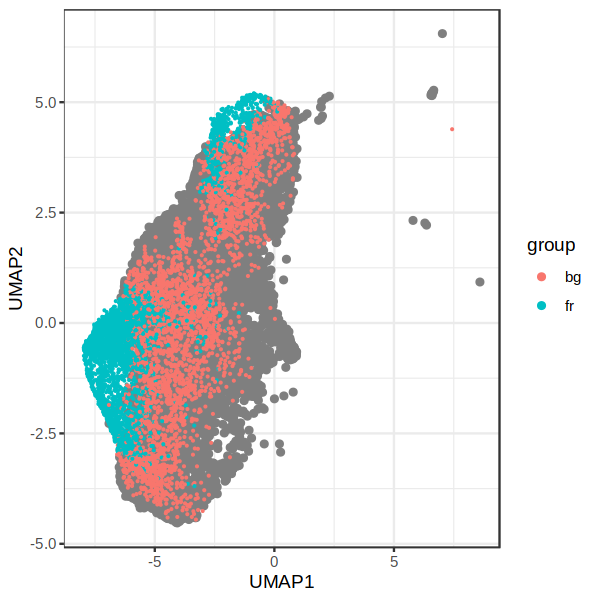

In [754]:
options(repr.plot.width=5, repr.plot.height=5)
plot = meta3 %>%
    .[, group := ifelse(cell %in% fr_cells, 'fr',
                        ifelse(cell %in% bg_cells, 'bg',
                               NA))]

ggplot(plot[!is.na(group)], aes(UMAP1, UMAP2, color = group)) + 
    geom_point(data = plot[is.na(group)]) + 
    geom_point(size = 0.1) + 
    theme_bw()

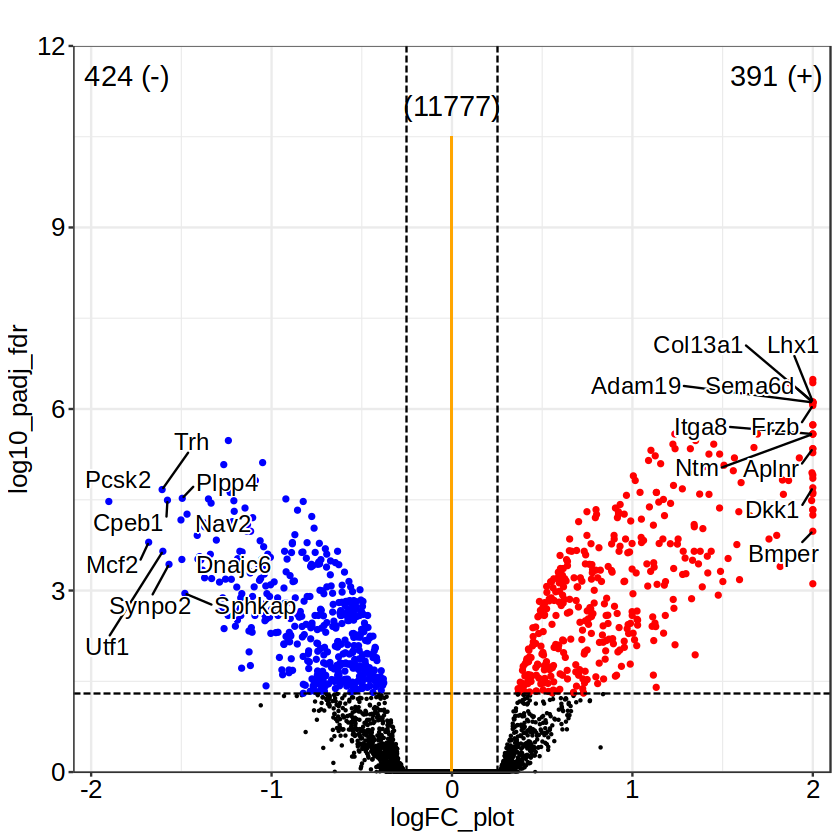

In [755]:
options(repr.plot.width = 7, repr.plot.height = 7)
tmp = run_edger(bg_cells = bg_cells, fr_cells = fr_cells, logFC = 0.25)
tmp$plot
fwrite(tmp$DEGs, sprintf('%s/celltype_DEGs_EOdPS_nPS_WTonly_edgeR.txt.gz', args$outdir))

### Comparison to nearest KD cells

In [756]:
background = factors.mtx[meta3[genotype == 'Eomes_KO',
                      cell],]
query = factors.mtx[meta3[Eo_depleted == TRUE & genotype == 'WT', cell],]

In [757]:
NN = BiocNeighbors::queryKNN(background,
         query = query,
         k = 100)

In [758]:
bg_cells = rownames(background)[unique_NN(NN$index, ratio = 2)]
fr_cells = rownames(query)

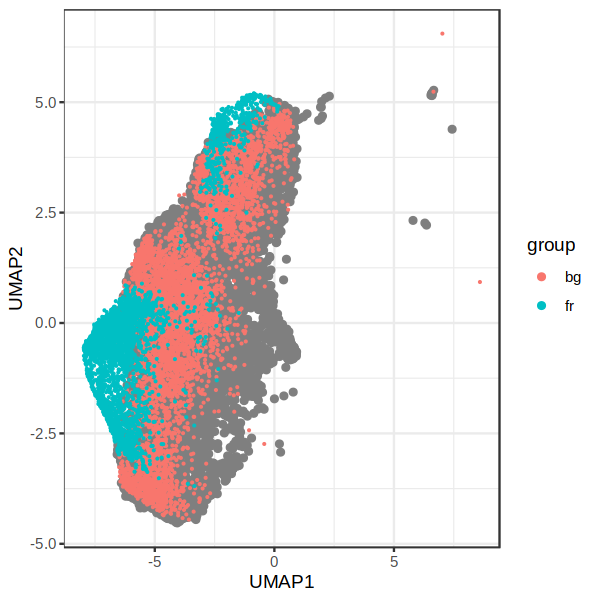

In [759]:
options(repr.plot.width=5, repr.plot.height=5)
plot = meta3 %>%
    .[, group := ifelse(cell %in% fr_cells, 'fr',
                        ifelse(cell %in% bg_cells, 'bg',
                               NA))]

ggplot(plot[!is.na(group)], aes(UMAP1, UMAP2, color = group)) + 
    geom_point(data = plot[is.na(group)]) + 
    geom_point(size = 0.1) + 
    theme_bw()

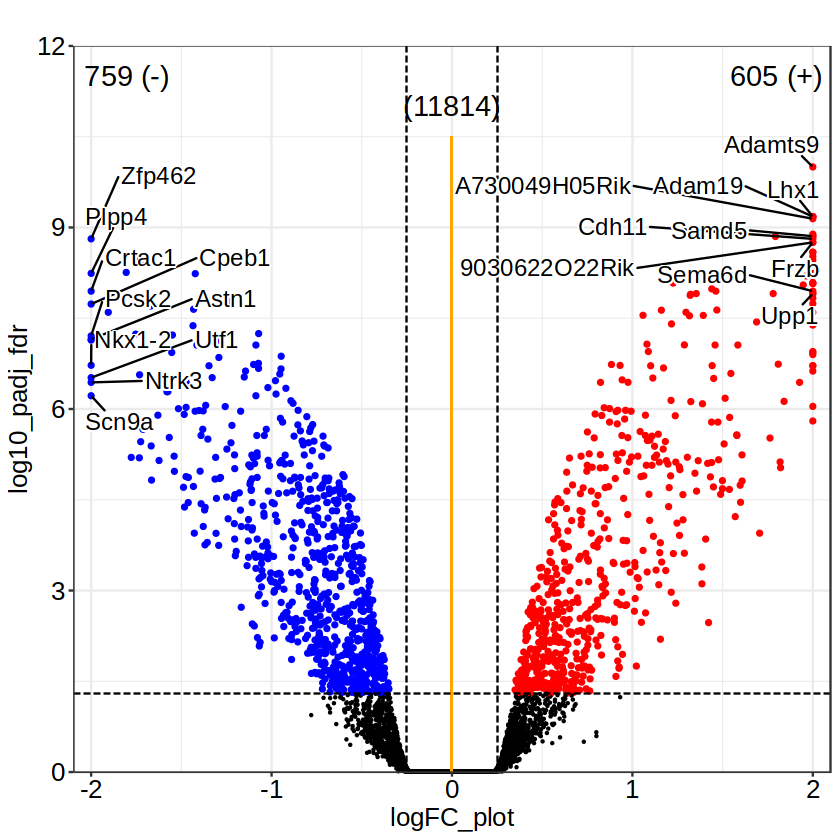

In [760]:
options(repr.plot.width = 7, repr.plot.height = 7)
tmp = run_edger(bg_cells = bg_cells, fr_cells = fr_cells, logFC = 0.25)
tmp$plot
fwrite(tmp$DEGs, sprintf('%s/celltype_DEGs_EOdPS_nPS_WTonly_edgeR.txt.gz', args$outdir))

### Comparison between nearest KD and WT cells

In [761]:
background = factors.mtx[meta3[Eo_depleted != TRUE & 
                            genotype == 'WT',
                      cell],]
query = factors.mtx[meta3[Eo_depleted == TRUE & genotype == 'WT', cell],]

NN = BiocNeighbors::queryKNN(background,
         query = query,
         k = 100)
fr_cells = rownames(background)[unique_NN(NN$index, ratio = 2)]


In [762]:
background = factors.mtx[meta3[genotype == 'Eomes_KO',
                      cell],]
query = factors.mtx[meta3[Eo_depleted == TRUE, cell],]

NN = BiocNeighbors::queryKNN(background,
         query = query,
         k = 100)

bg_cells = rownames(background)[unique_NN(NN$index, ratio = 2)]

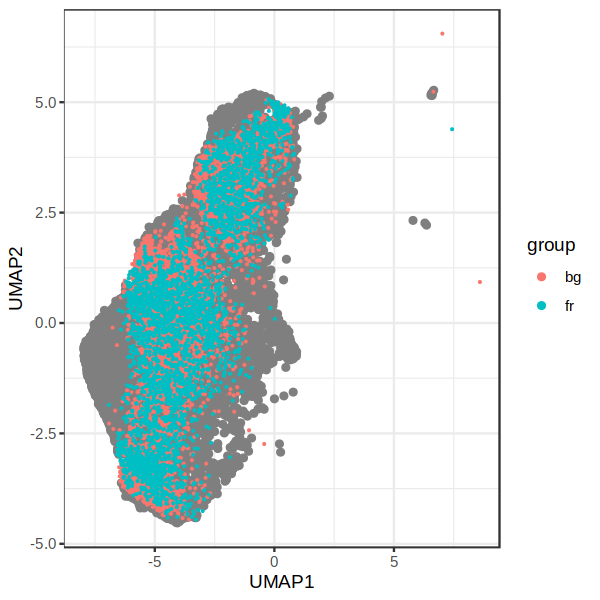

In [763]:
options(repr.plot.width=5, repr.plot.height=5)
plot = meta3 %>%
    .[, group := ifelse(cell %in% fr_cells, 'fr',
                        ifelse(cell %in% bg_cells, 'bg',
                               NA))]

ggplot(plot[!is.na(group)], aes(UMAP1, UMAP2, color = group)) + 
    geom_point(data = plot[is.na(group)]) + 
    geom_point(size = 0.1) + 
    theme_bw()

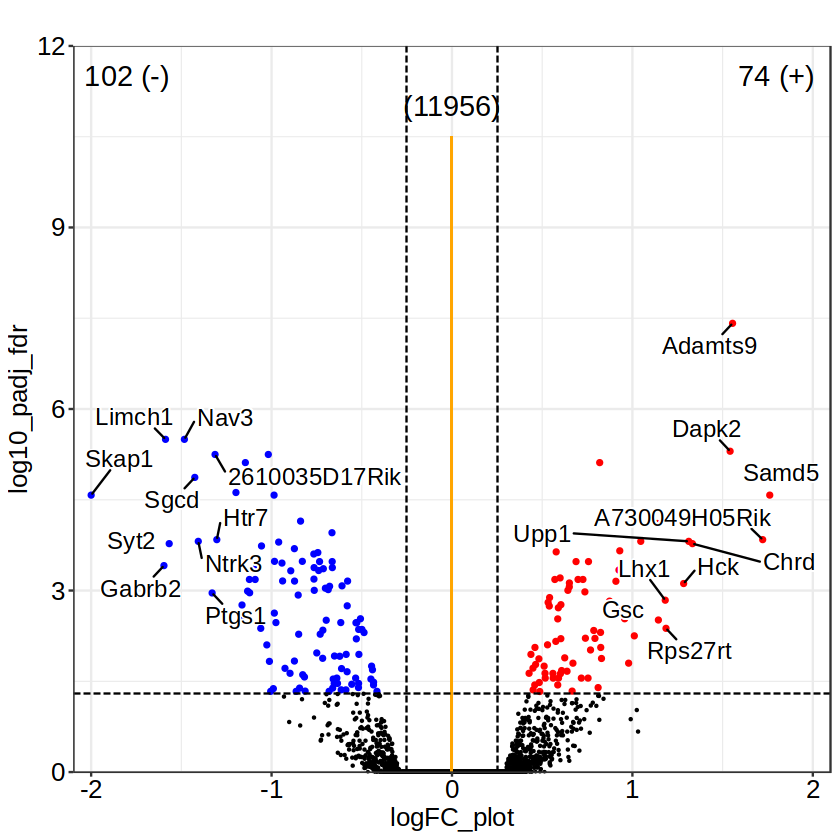

In [764]:
options(repr.plot.width = 7, repr.plot.height = 7)
tmp = run_edger(bg_cells = bg_cells, fr_cells = fr_cells, logFC = 0.25)
tmp$plot
fwrite(tmp$DEGs, sprintf('%s/celltype_DEGs_nPS_nPS_KD_WT_edgeR.txt.gz', args$outdir))

In [994]:
withinPS = fread(sprintf('%s/celltype_DEGs_nPS_nPS_KD_WT_edgeR.txt.gz', args$outdir))#[sign != 'nonsig']
betweenPS = fread(sprintf('%s/celltype_DEGs_EOdPS_nPS_WTonly_edgeR.txt.gz', args$outdir))#[sign != 'nonsig']

In [995]:
merge = merge(withinPS %>%
                    .[, .(gene, logFC, padj_fdr)] %>% 
                    setnames(c('logFC', 'padj_fdr'), c('logFC_within', 'padj_fdr_within')),
                betweenPS %>%
                    .[, .(gene, logFC, padj_fdr)] %>% 
                    setnames(c('logFC', 'padj_fdr'), c('logFC_between', 'padj_fdr_between')),
              by = 'gene', all = T) %>% 
                .[, minFDR := pmin(padj_fdr_within, padj_fdr_between)]

merge[, c(2,4)][is.na(merge[, c(2,4)])] <- 0
merge[, c(3,5)][is.na(merge[, c(3,5)])] <- 1

merge = merge %>% 
                .[, minFDR := pmin(padj_fdr_within, padj_fdr_between)] %>% 
                .[, maxFDR := pmax(padj_fdr_within, padj_fdr_between)] %>% 
                .[, meanlogFC := rowMeans(abs(.SD), na.rm = TRUE), .SDcols = c("logFC_within", "logFC_between")]



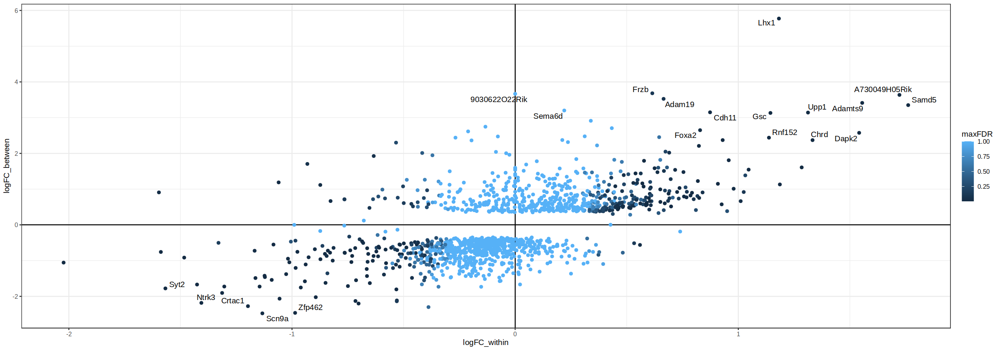

In [996]:
ggplot(merge[minFDR < 0.05], aes(logFC_within, logFC_between, color = maxFDR)) + 
    geom_hline(yintercept = 0) + 
    geom_vline(xintercept = 0) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(merge[minFDR < 0.05][order(-meanlogFC)], 20),
                             aes(label = gene),
                             color = 'black') + 
    theme_bw()

## Plot genes

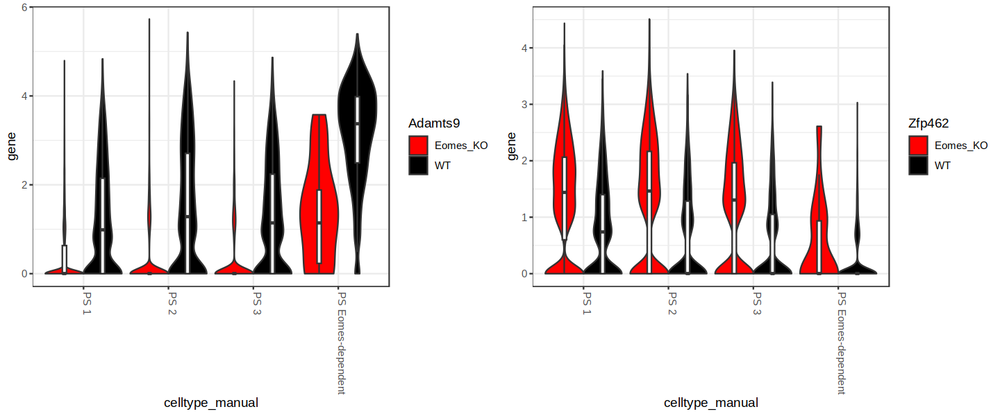

In [664]:
plot_gene = function(gene){
    meta = meta[match(colnames(rna.sce), cell)]
    meta$gene = as.vector(logcounts(rna.sce[gene,]))

    options(repr.plot.width=12, repr.plot.height=5)
    ggplot(meta[day == 'D3'], aes(celltype_manual, gene, fill=genotype)) + 
        geom_violin(scale = 'width') +
        geom_boxplot(aes(group = interaction(genotype, celltype_manual)), fill = 'white', width = 0.1, position = position_dodge(0.9), outlier.shape = NA) + 
        scale_fill_manual(values=c('WT' = 'black', 'Eomes_KO'= 'red'), name=gene) + 
       # facet_wrap(~genotype) + 
        theme_bw() + 
        theme(strip.text=element_text(size=25),
             axis.text.x = element_text(angle=-90, hjust=0, vjust=0))
}

options(repr.plot.width = 7, repr.plot.height = 7)
ggarrange(plotlist = lapply(c('Adamts9', 'Zfp462'), FUN = plot_gene))

# ATAC

## EdgeR on replicates

In [12]:
library(ArchR)


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .______      
          /   \     |   _ 

In [13]:
archr = loadArchRProject(io$archR.directory)

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [14]:
args$outdir

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/rna_atac/differential/v2/expression/"

In [15]:
new_peaks = readRDS('/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/rna_atac/clustering/early_peaks.rds')

In [669]:
## Get motif matches for example motifs in peaks 
## Adapted from: https://rdrr.io/github/GreenleafLab/ArchR/src/R/AnnotationPeaks.R
# Load motifs
library(motifmatchr)
library(chromVARmotifs)

data("mouse_pwms_v2")
motifs <- mouse_pwms_v2
obj <- ArchR:::.summarizeChromVARMotifs(motifs)
motifs <- obj$motifs
motifSummary <- obj$motifSummary
names(motifs) = gsub( 'Tcfap', 'tfap', names(motifs))

# Find scores
motifmatcher.se <-  motifmatchr::matchMotifs(pwms = motifs, 
                                        subject = new_peaks, 
                                        genome = "mm10", 
                                        out = 'scores',
                                        p.cutoff = 5e-05,
                                        w = 7) 

rownames(motifmatcher.se) = paste0(seqnames(new_peaks), ':', start(new_peaks), '-', end(new_peaks))

In [16]:
# matches <- getMatches(ArchRProject, 'Motif_cisbp')
# rownames(matches) = rownames(atac.sce)

io$multiome = '/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/results/multiome_atlas/'
silico_chip = readRDS(file.path(io$multiome, 'vitro_peaks_silicoChIP_cisbp_earlyPeaks.rds'))
assay(silico_chip, 'matches') = assay(silico_chip, 'VirtualChipScores') > 0.2 # keep only motifs with in silico score > 0.2
assay(silico_chip, 'motifScores') = NULL
assay(silico_chip, 'motifMatches') = NULL
assay(silico_chip, 'motifCounts') = NULL
assay(silico_chip, 'VirtualChipScores') = NULL
matches = silico_chip

# Need to re-run in silico ChIP on new peak set...
# Definitely do this in the future...
# for now:
# matches = motifmatcher.se

In [17]:
addArchRThreads(42)

Setting default number of Parallel threads to 42.



In [672]:
peakmtx = addFeatureMatrix(
  input = archr,
  features = new_peaks,
  matrixName = "new_peaks",
  ceiling = 4,
  binarize = FALSE,
  verbose = TRUE,
  threads = getArchRThreads(),
  parallelParam = NULL,
  force = TRUE,
  logFile = createLogFile("addFeatureMatrix")
)

ArchR logging to : ArchRLogs/ArchR-addFeatureMatrix-24434c48b94119-Date-2024-10-07_Time-13-44-28.log
If there is an issue, please report to github with logFile!

2024-10-07 13:44:30 : Batch Execution w/ safelapply!, 0 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-addFeatureMatrix-24434c48b94119-Date-2024-10-07_Time-13-44-28.log



In [673]:
atac.sce = getMatrixFromProject(
  ArchRProj = archr,
  useMatrix = "new_peaks")

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-24434c34b7c9c2-Date-2024-10-07_Time-13-48-37.log
If there is an issue, please report to github with logFile!

2024-10-07 13:49:20 : Organizing colData, 0.711 mins elapsed.

2024-10-07 13:49:21 : Organizing rowData, 0.719 mins elapsed.

2024-10-07 13:49:21 : Organizing rowRanges, 0.719 mins elapsed.

2024-10-07 13:49:21 : Organizing Assays (1 of 1), 0.72 mins elapsed.

2024-10-07 13:49:49 : Constructing SummarizedExperiment, 1.193 mins elapsed.

2024-10-07 13:50:27 : Finished Matrix Creation, 1.832 mins elapsed.



In [674]:
atac.sce = as(atac.sce, 'SingleCellExperiment')

In [675]:
counts(atac.sce) = atac.sce@assays@data$new_peaks

In [676]:
peaks = archr@peakSet
peaks = paste0(seqnames(new_peaks), ':', start(new_peaks), '-', end(new_peaks))

In [677]:
rownames(atac.sce) = peaks

In [678]:
atac.sce

class: SingleCellExperiment 
dim: 211325 68312 
metadata(0):
assays(2): new_peaks counts
rownames(211325): chr1:3035656-3036156 chr1:3062738-3063238 ...
  chrX:169906143-169906643 chrX:169935902-169936402
rowData names(1): idx
colnames(68312): RBG43473#CCGCAAATCATTATGG-1
  RBG43473#GGATGTAAGGGCTTTG-1 ... RBG43478#GGCCTCTGTAACAGGG-1
  RBG43478#TTGACTAAGGCCTGGT-1
colData names(38): BlacklistRatio nDiFrags ... ReadsInPeaks FRIP
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [765]:
run_edger = function(fr_cells = fr_cells, bg_cells = bg_cells, logFC = args$logFC){
    sce = atac.sce[, c(bg_cells, fr_cells)]
    sce$group = ifelse(colnames(sce) %in% fr_cells, 'fr', 'bg') 
    sce$group_by = paste0(sce$group, '_', sce$sample)   
    
    sce = aggregateAcrossCells(sce, id=sce$group_by, BPPARAM = BPPARAM)
    
    # Convert SCE to DGEList
    sce_edger <- scran::convertTo(sce, type="edgeR")

    keep.genes <- filterByExpr(sce_edger, group=sce_edger$samples$group, min.count = 50, min.total.count = 200)
    sce_edger = sce_edger[keep.genes, ]

    # Calculate Normalisation Factors
    sce_edger <- calcNormFactors(sce_edger)

    # Define design matrix (with intercept)
    design <- model.matrix(~sce$group)

    # Estimate dispersions
    sce_edger  <- estimateDisp(sce_edger,design)

    # Fit GLM
    fit <- glmQLFit(sce_edger,design)

    # Likelihood ratio test
    lrt <- glmQLFTest(fit)

    # Testing above logFC threshold
    lrt = glmTreat(fit, lfc=logFC)

    # Construct output data.frame
    out <- topTags(lrt, n=nrow(lrt))$table %>% as.data.table(keep.rownames=T) %>%
     setnames(c("gene", "idx", "logFC", "unshrunk.logFC","logCPM", "p.value","padj_fdr"))
    
    plot = volcano_plot(out,ylim = 10, FDR_thr = 0.05, logFC_thr = 0.25, ntop = 1)
    
    tmp = list(out, plot)
    names(tmp) = c('DEGs', 'plot')
    return(tmp)
}

### Comparison to nearest WT cells

In [766]:
background = factors.mtx[meta3[Eo_depleted != TRUE & 
                            genotype == 'WT',
                      cell],]
query = factors.mtx[meta3[Eo_depleted == TRUE & genotype == 'WT', cell],]

In [767]:
NN = BiocNeighbors::queryKNN(background,
         query = query,
         k = 100)

In [768]:
bg_cells = rownames(background)[unique_NN(NN$index, ratio = 2)]
fr_cells = rownames(query)

In [769]:
length(bg_cells)
length(fr_cells)

[1] 3385

[1] 3274

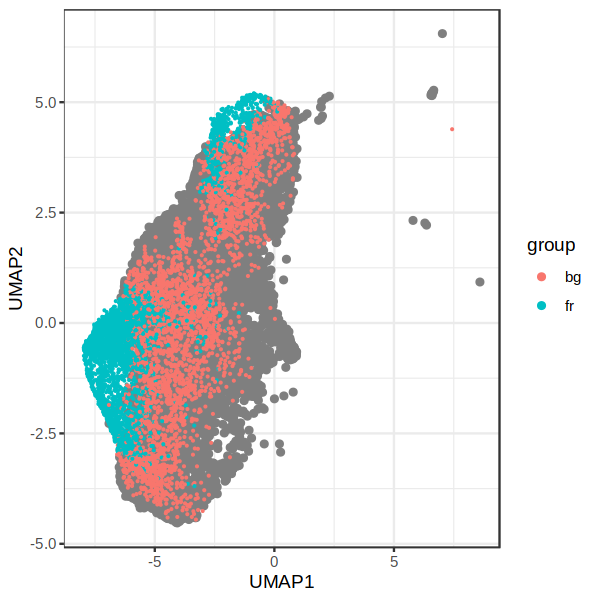

In [770]:
options(repr.plot.width=5, repr.plot.height=5)
plot = meta3 %>%
    .[, group := ifelse(cell %in% fr_cells, 'fr',
                        ifelse(cell %in% bg_cells, 'bg',
                               NA))]

ggplot(plot[!is.na(group)], aes(UMAP1, UMAP2, color = group)) + 
    geom_point(data = plot[is.na(group)]) + 
    geom_point(size = 0.1) + 
    theme_bw()

Zero log2-FC threshold detected. Switch to glmQLFTest() instead. 


Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


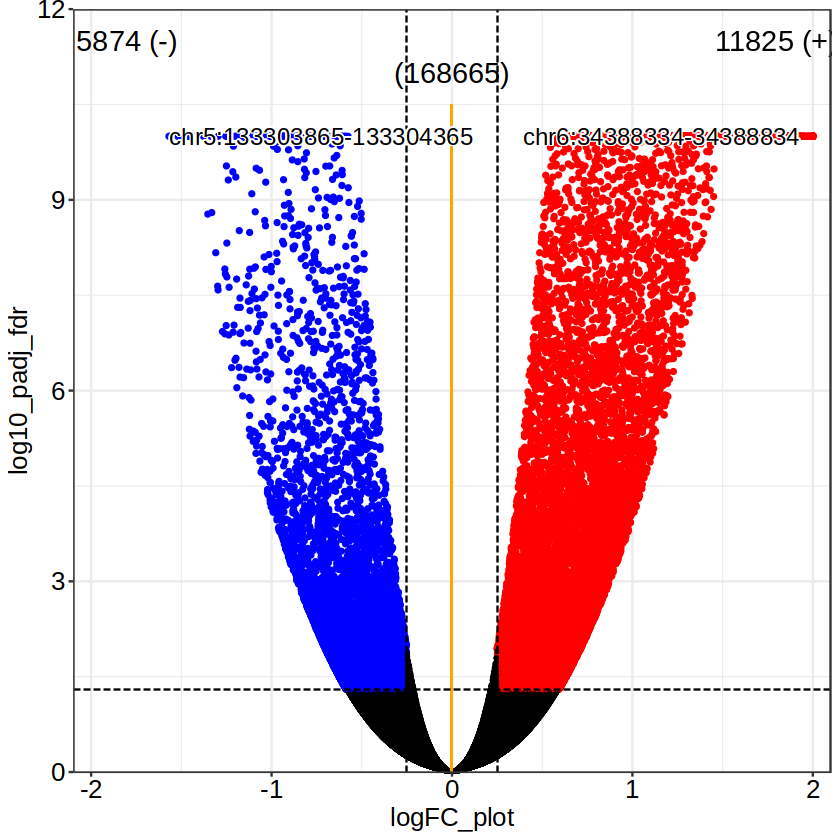

In [771]:
options(repr.plot.width = 7, repr.plot.height = 7)
tmp = run_edger(bg_cells = bg_cells, fr_cells = fr_cells, logFC = 0)
tmp$plot
fwrite(tmp$DEGs, sprintf('%s/celltype_DARs_EOdPS_nPS_WTonly_edgeR.txt.gz', args$outdir))

Warning message:
“ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


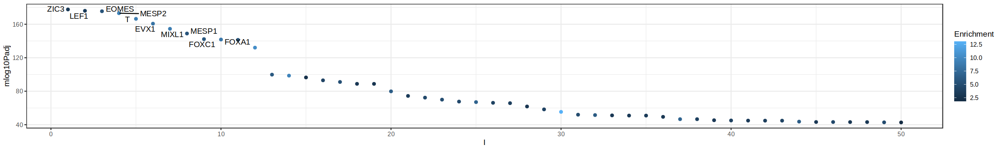

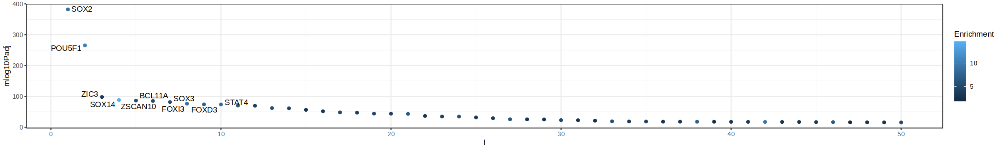

In [772]:
options(repr.plot.width = 20, repr.plot.height = 3)

DARs = tmp$DEGs
tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, DARs[logFC > 0 & padj_fdr < 5e-2, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, DARs[logFC < 0 & padj_fdr < 5e-2, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

### Comparison to nearest KD cells

In [773]:
background = factors.mtx[meta3[genotype == 'Eomes_KO',
                      cell],]
query = factors.mtx[meta3[Eo_depleted == TRUE & genotype == 'WT', cell],]

In [774]:
NN = BiocNeighbors::queryKNN(background,
         query = query,
         k = 100)

In [775]:
bg_cells = rownames(background)[unique_NN(NN$index, ratio = 2)]
fr_cells = rownames(query)

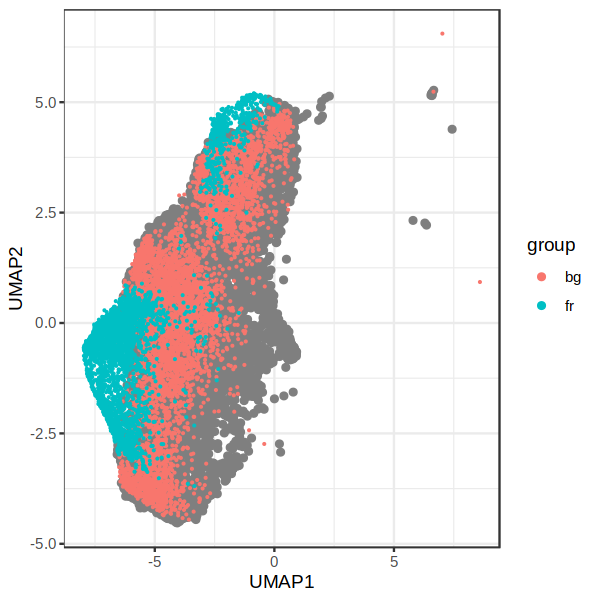

In [776]:
options(repr.plot.width=5, repr.plot.height=5)
plot = meta3 %>%
    .[, group := ifelse(cell %in% fr_cells, 'fr',
                        ifelse(cell %in% bg_cells, 'bg',
                               NA))]

ggplot(plot[!is.na(group)], aes(UMAP1, UMAP2, color = group)) + 
    geom_point(data = plot[is.na(group)]) + 
    geom_point(size = 0.1) + 
    theme_bw()

Zero log2-FC threshold detected. Switch to glmQLFTest() instead. 


Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


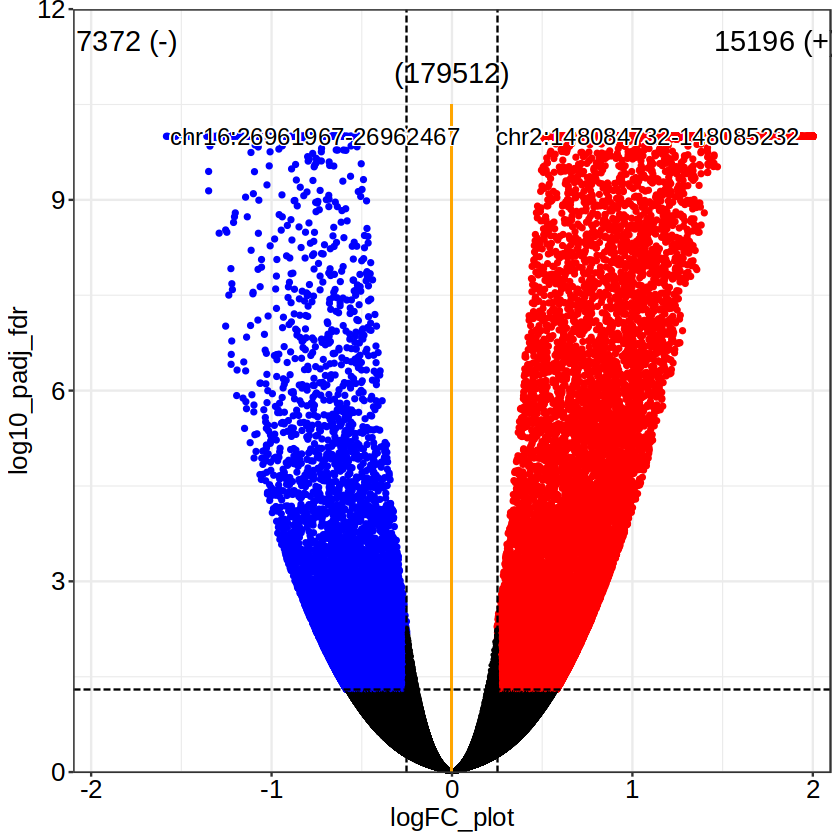

In [777]:
options(repr.plot.width = 7, repr.plot.height = 7)
tmp = run_edger(bg_cells = bg_cells, fr_cells = fr_cells, logFC = 0)
tmp$plot
fwrite(tmp$DEGs, sprintf('%s/celltype_DARs_EOdPS_nPS_WTonly_edgeR.txt.gz', args$outdir))

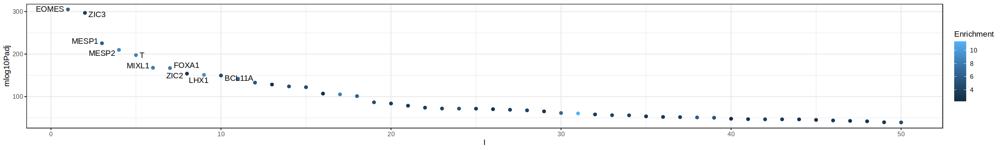

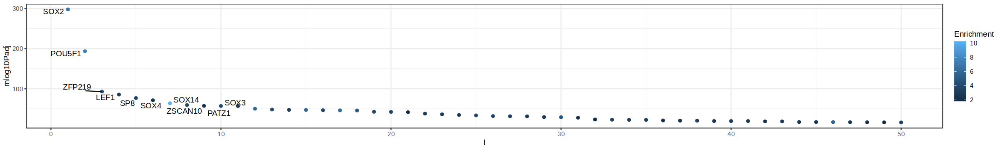

In [778]:
options(repr.plot.width = 20, repr.plot.height = 3)

DARs = tmp$DEGs
tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, DARs[logFC > 0 & padj_fdr < 5e-2, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, DARs[logFC < 0 & padj_fdr < 5e-2, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

### Comparison between nearest KD and WT cells

In [779]:
background = factors.mtx[meta3[Eo_depleted != TRUE & 
                            genotype == 'WT',
                      cell],]
query = factors.mtx[meta3[Eo_depleted == TRUE & genotype == 'WT', cell],]

NN = BiocNeighbors::queryKNN(background,
         query = query,
         k = 100)
fr_cells = rownames(background)[unique_NN(NN$index, ratio = 2)]


In [780]:
background = factors.mtx[meta3[genotype == 'Eomes_KO',
                      cell],]
query = factors.mtx[meta3[Eo_depleted == TRUE & genotype == 'WT', cell],]

NN = BiocNeighbors::queryKNN(background,
         query = query,
         k = 100)

bg_cells = rownames(background)[unique_NN(NN$index, ratio = 2)]

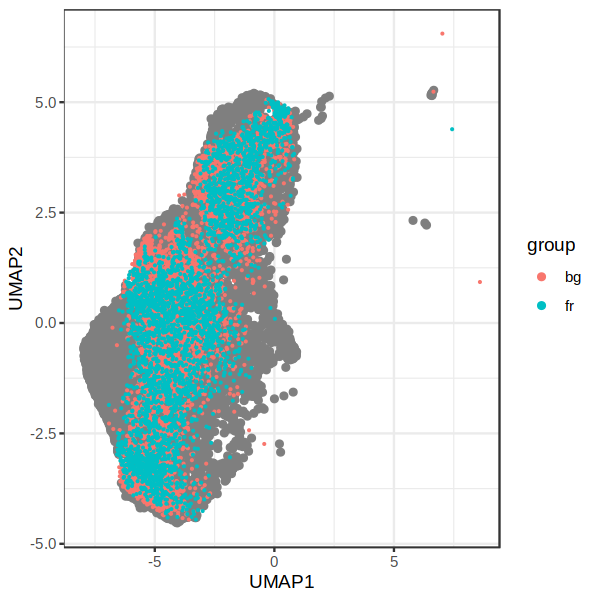

In [781]:
options(repr.plot.width=5, repr.plot.height=5)
plot = meta3 %>%
    .[, group := ifelse(cell %in% fr_cells, 'fr',
                        ifelse(cell %in% bg_cells, 'bg',
                               NA))]

ggplot(plot[!is.na(group)], aes(UMAP1, UMAP2, color = group)) + 
    geom_point(data = plot[is.na(group)]) + 
    geom_point(size = 0.1) + 
    theme_bw()

Zero log2-FC threshold detected. Switch to glmQLFTest() instead. 


Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


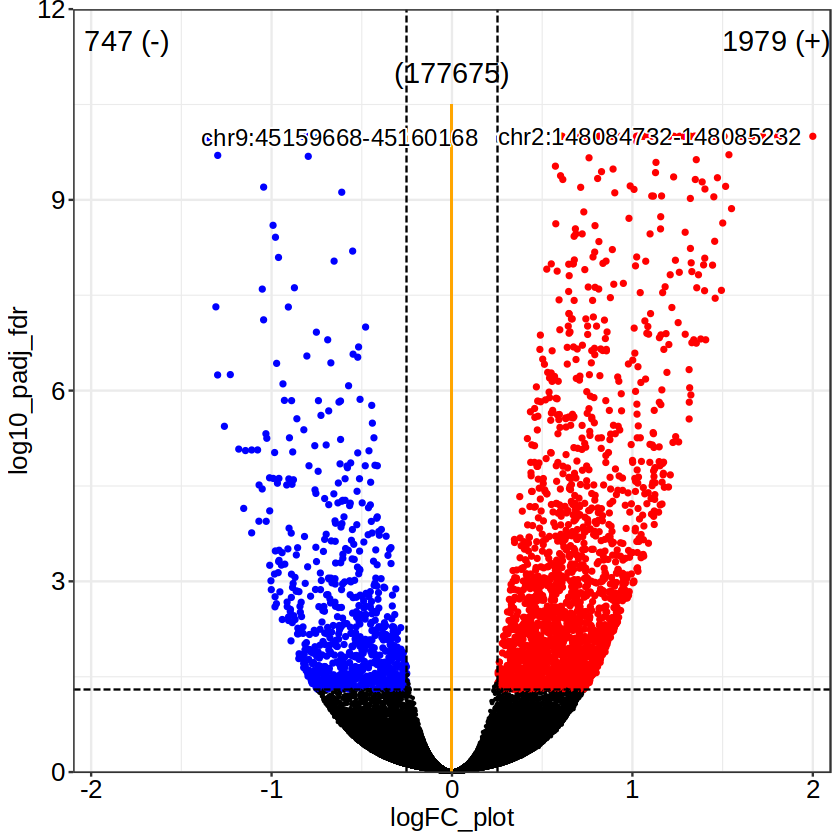

In [782]:
options(repr.plot.width = 7, repr.plot.height = 7)
tmp = run_edger(bg_cells = bg_cells, fr_cells = fr_cells, logFC = 0)
tmp$plot
fwrite(tmp$DEGs, sprintf('%s/celltype_DARs_nPS_nPS_KD_WT_edgeR.txt.gz', args$outdir))

Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


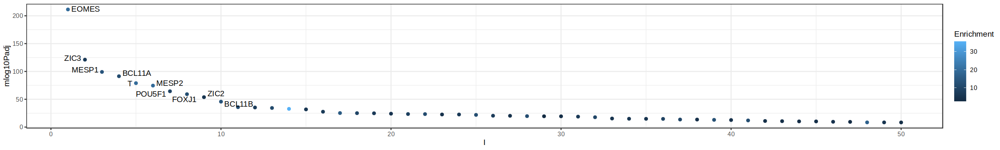

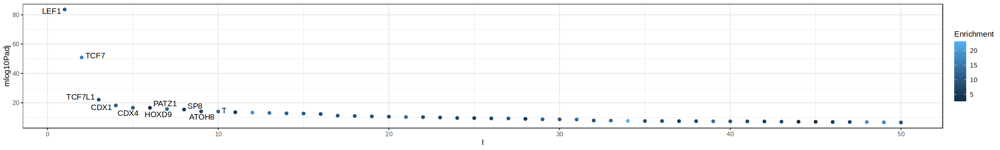

In [783]:
options(repr.plot.width = 20, repr.plot.height = 3)

DARs = tmp$DEGs
tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, DARs[logFC > 0 & padj_fdr < 5e-2, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, DARs[logFC < 0 & padj_fdr < 5e-2, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

## Intersect ATAC

In [45]:
withinPS = fread(sprintf('%s/celltype_DARs_nPS_nPS_KD_WT_edgeR.txt.gz', args$outdir))#[sign != 'nonsig']
betweenPS = fread(sprintf('%s/celltype_DARs_EOdPS_nPS_WTonly_edgeR.txt.gz', args$outdir))#[sign != 'nonsig']

In [46]:
merge = merge(withinPS %>%
                    .[, .(gene, logFC, padj_fdr)] %>% 
                    setnames(c('logFC', 'padj_fdr'), c('logFC_within', 'padj_fdr_within')),
                betweenPS %>%
                    .[, .(gene, logFC, padj_fdr)] %>% 
                    setnames(c('logFC', 'padj_fdr'), c('logFC_between', 'padj_fdr_between')),
              by = 'gene', all = T) %>% 
                .[, minFDR := pmin(padj_fdr_within, padj_fdr_between)]

merge[, c(2,4)][is.na(merge[, c(2,4)])] <- 0
merge[, c(3,5)][is.na(merge[, c(3,5)])] <- 1

merge = merge %>% 
                .[, minFDR := pmin(padj_fdr_within, padj_fdr_between)] %>% 
                .[, maxFDR := pmax(padj_fdr_within, padj_fdr_between)] %>% 
                .[, meanlogFC := rowMeans(abs(.SD), na.rm = TRUE), .SDcols = c("logFC_within", "logFC_between")]



Warning message:
“ggrepel: 15 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


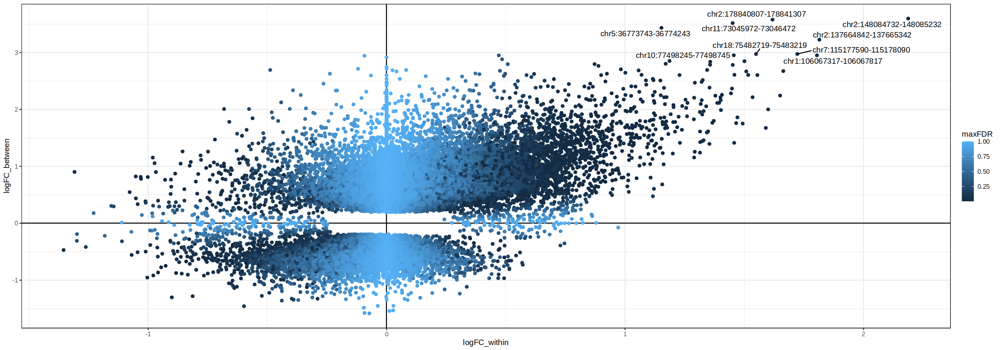

In [999]:
ggplot(merge[minFDR < 0.05], aes(logFC_within, logFC_between, color = maxFDR)) + 
    geom_hline(yintercept = 0) + 
    geom_vline(xintercept = 0) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(merge[minFDR < 0.05][order(-meanlogFC)], 20),
                             aes(label = gene),
                             color = 'black') + 
    theme_bw()

In [47]:
KD_comparison = fread(sprintf('%s/celltype_DARs_nPS_nPS_KD_WT_edgeR.txt.gz', args$outdir)) %>% 
    .[,.(gene, logFC, padj_fdr)] %>% 
    setnames(c('logFC', 'padj_fdr'),  c('logFC_KD', 'padj_fdr_KD'))
WT_comparison = fread(sprintf('%s/celltype_DARs_EOdPS_nPS_WTonly_edgeR.txt.gz', args$outdir)) %>%
    .[,.(gene, logFC, padj_fdr)] %>% 
    setnames(c('logFC', 'padj_fdr'),  c('logFC_WT', 'padj_fdr_WT'))


In [48]:
comparison = merge(KD_comparison, WT_comparison, by = 'gene', all = T)

In [49]:
overlap = comparison[!is.na(logFC_KD) & !is.na(logFC_WT)] %>% 
    .[, mean_fdr := (padj_fdr_KD + padj_fdr_WT)/2, by = 'gene'] %>% 
    .[order(mean_fdr)]

In [787]:
nrow(overlap)

[1] 173692

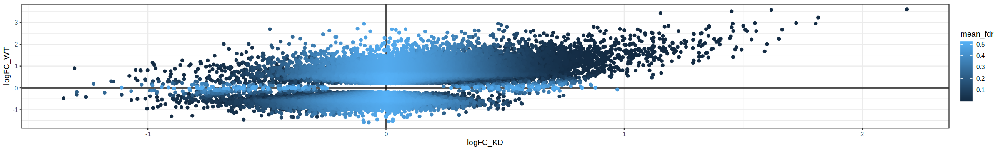

In [788]:
ggplot(overlap[padj_fdr_KD < 0.05 | padj_fdr_WT < 0.05], aes(logFC_KD, logFC_WT, color = mean_fdr)) + 
    geom_hline(yintercept = 0) + 
    geom_vline(xintercept = 0) + 
    geom_point() +
    theme_bw()

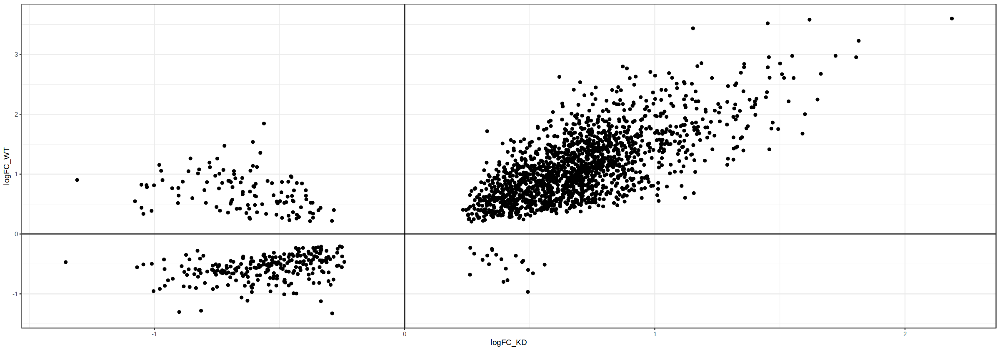

In [981]:
ggplot(overlap[padj_fdr_KD < 0.05 & padj_fdr_WT < 0.05], aes(logFC_KD, logFC_WT)) + 
    geom_hline(yintercept = 0) + 
    geom_vline(xintercept = 0) + 
    geom_point() +
    theme_bw()

In [789]:
length(overlap[logFC_WT > 0 & logFC_KD > 0, gene])

[1] 53589

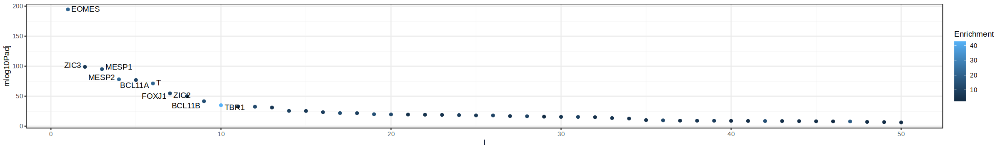

In [790]:
DARs = DARs$DEGs
tmp = as.data.table(ArchR:::.computeEnrichment(matches, overlap[logFC_WT > 0 & logFC_KD > 0 & padj_fdr_KD < 0.05 & padj_fdr_WT < 0.05, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp[order(-mlog10Padj)] %>% .[,I := .I]
ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

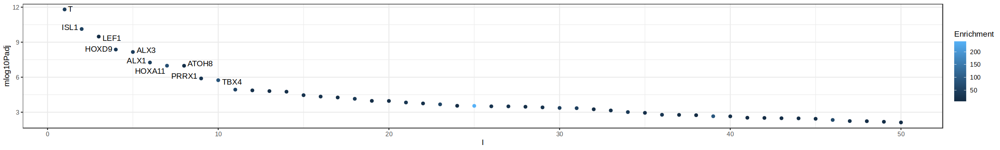

In [791]:
DARs = DARs$DEGs
tmp = as.data.table(ArchR:::.computeEnrichment(matches, overlap[logFC_WT > 0 & logFC_KD < 0 & padj_fdr_KD < 0.05 & padj_fdr_WT < 0.05, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp[order(-mlog10Padj)] %>% .[,I := .I]
ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

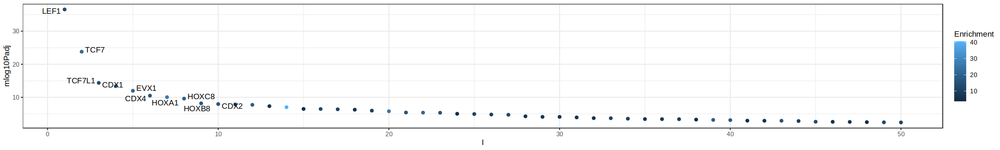

In [792]:
DARs = DARs$DEGs
tmp = as.data.table(ArchR:::.computeEnrichment(matches, overlap[logFC_WT < 0 & logFC_KD < 0 & padj_fdr_KD < 0.05 & padj_fdr_WT < 0.05, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp[order(-mlog10Padj)] %>% .[,I := .I]
ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

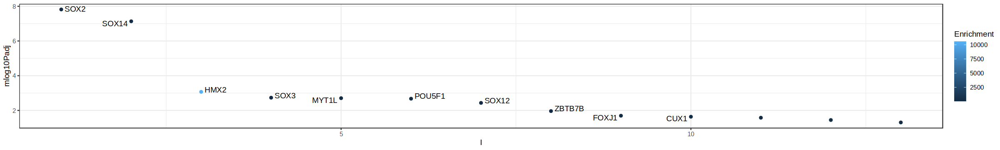

In [793]:
DARs = DARs$DEGs
tmp = as.data.table(ArchR:::.computeEnrichment(matches, overlap[logFC_WT < 0 & logFC_KD > 0 & padj_fdr_KD < 0.05 & padj_fdr_WT < 0.05, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp[order(-mlog10Padj)] %>% .[,I := .I]
ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

In [794]:
head(comparison)

gene,logFC_KD,padj_fdr_KD,logFC_WT,padj_fdr_WT
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
chr10:100015512-100016012,0.096618948,0.7312091,0.01793014,9.317974e-01
chr10:100016022-100016522,-0.012490292,0.9825482,-0.02919280,8.956875e-01
chr10:100017190-100017690,NA,NA,0.03040074,9.613324e-01
chr10:100031675-100032175,0.005524811,0.9974484,0.08625840,8.713465e-01
chr10:100037444-100037944,0.146198696,0.8764038,0.81282620,3.519499e-05
chr10:100038481-100038981,NA,NA,0.39881932,2.496037e-01


In [795]:
DARs = comparison[logFC_KD > 0.25 & padj_fdr_KD < 0.05]
bed = data.table(chr = str_split(DARs$gene, ':') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(2))
fwrite(bed, file.path(args$outdir, 'KD_up.bed'), col.names = F, sep = '\t')

DARs = comparison[logFC_KD < 0.25 & padj_fdr_KD < 0.05]
bed = data.table(chr = str_split(DARs$gene, ':') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(2))
fwrite(bed, file.path(args$outdir, 'KD_down.bed'), col.names = F, sep = '\t')

DARs = comparison[logFC_WT > 0.25 & padj_fdr_WT < 0.05]
bed = data.table(chr = str_split(DARs$gene, ':') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(2))
fwrite(bed, file.path(args$outdir, 'WT_up.bed'), col.names = F, sep = '\t')

DARs = comparison[logFC_WT < 0.25 & padj_fdr_WT < 0.05]
bed = data.table(chr = str_split(DARs$gene, ':') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(2))
fwrite(bed, file.path(args$outdir, 'WT_down.bed'), col.names = F, sep = '\t')


DARs = comparison[logFC_WT > 0.25 & logFC_KD > 0.25  & padj_fdr_WT < 0.05 & padj_fdr_KD < 0.05]
bed = data.table(chr = str_split(DARs$gene, ':') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(2))
fwrite(bed, file.path(args$outdir, 'WT_up_KD_up.bed'), col.names = F, sep = '\t')

DARs = comparison[logFC_WT > 0.25 & logFC_KD < 0.25  & padj_fdr_WT < 0.05 & padj_fdr_KD < 0.05]
bed = data.table(chr = str_split(DARs$gene, ':') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(1),
                 start = str_split(str_split(DARs$gene, ':') %>% map_chr(2), '-') %>% map_chr(2))
fwrite(bed, file.path(args$outdir, 'WT_up_KD_down.bed'), col.names = F, sep = '\t')

In [796]:
# Motif search using Homer
files = gsub('.bed', '', list.files(args$outdir, pattern = '.bed'))
mclapply(files, function(x){
    cmd = sprintf('/rds/project/rds-SDzz0CATGms/users/bt392/software/homer/bin/findMotifsGenome.pl %s/%s.bed mm10 %s/%s -size 75 -S 5 -len 8,10,12  -p 24', 
                       args$outdir, x,
                         args$outdir, x,
                          args$outdir)
    system(cmd)
},mc.cores=12)

[[1]]
[1] 0

[[2]]
[1] 0

[[3]]
[1] 0

[[4]]
[1] 0

[[5]]
[1] 0

[[6]]
[1] 0

[[7]]
[1] 0

[[8]]
[1] 0

[[9]]
[1] 0

### Export Bigwigs

In [36]:
background = factors.mtx[meta3[Eo_depleted != TRUE & 
                            genotype == 'WT',
                      cell],]
query = factors.mtx[meta3[Eo_depleted == TRUE, cell],]

NN = BiocNeighbors::queryKNN(background,
         query = query,
         k = 100)
WT_nearest = rownames(background)[unique_NN(NN$index, ratio = 2)]


In [37]:
background = factors.mtx[meta3[genotype == 'Eomes_KO',
                      cell],]
query = factors.mtx[meta3[Eo_depleted == TRUE, cell],]

NN = BiocNeighbors::queryKNN(background,
         query = query,
         k = 100)

KD_nearest = rownames(background)[unique_NN(NN$index, ratio = 2)]

WT_depleted = meta3[Eo_depleted == TRUE & genotype == 'WT', cell]


In [38]:
meta3 = meta3 %>%
    .[, group := ifelse(cell %in% WT_depleted, 'WT_depleted',
                        ifelse(cell %in% WT_nearest, 'WT_nearest',
                               ifelse(cell %in% KD_nearest, 'KD_nearest',
                                      'Other')))]

In [39]:
table(meta3$group)


 KD_nearest       Other WT_depleted  WT_nearest 
       5155       12154        3274        3389 

In [806]:
archr = addCellColData(
  ArchRProj = archr,
  data = meta3$group,
  name = 'Comparison_group',
  cells = meta3$cell)

In [807]:
getGroupBW(
  ArchRProj = archr,
  groupBy = "Comparison_group",
  normMethod = "ReadsInTSS",
  tileSize = 100,
  maxCells = 1e9)

ArchR logging to : ArchRLogs/ArchR-getGroupBW-24434c2517cb09-Date-2024-10-07_Time-16-11-17.log
If there is an issue, please report to github with logFile!

2024-10-07 16:11:37 : KD_nearest (1 of 4) : Creating BigWig for Group, 0.324 mins elapsed.

2024-10-07 16:12:01 : Other (2 of 4) : Creating BigWig for Group, 0.73 mins elapsed.

2024-10-07 16:12:38 : WT_depleted (3 of 4) : Creating BigWig for Group, 1.35 mins elapsed.

2024-10-07 16:13:01 : WT_nearest (4 of 4) : Creating BigWig for Group, 1.73 mins elapsed.

ArchR logging successful to : ArchRLogs/ArchR-getGroupBW-24434c2517cb09-Date-2024-10-07_Time-16-11-17.log



[1] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/Comparison_group/KD_nearest-TileSize-100-normMethod-ReadsInTSS-ArchR.bw" 
[2] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/Comparison_group/Other-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"      
[3] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/Comparison_group/WT_depleted-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"
[4] "/rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/processed/atac/archR/GroupBigWigs/Comparison_group/WT_nearest-TileSize-100-normMethod-ReadsInTSS-ArchR.bw"

In [42]:
rna.sce_bw = rna.sce[,meta3$cell]
rna.sce_bw$celltype = meta3$group

In [841]:
table(rna.sce_bw$celltype)


 KD_nearest       Other WT_depleted  WT_nearest 
       5155       12154        3274        3389 

In [40]:
source(here::here("utils.R"))

In [41]:
# Load browser track files
ArchRProject = suppressMessages(ArchR::loadArchRProject(io$archR.directory))

args$vitro_bws = file.path(io$basedir, 'processed/atac/archR/GroupBigWigs/Comparison_group/')

bigwigs.data_vitro = data.table(celltype = list.files(args$vitro_bws, 'bw') %>% str_split(., '-') %>% map_chr(1),
                    path =  paste0(args$vitro_bws, list.files(args$vitro_bws, 'bw'))) 

bigwig_order = c(
                'WT_depleted','WT_nearest',
                'KD_nearest'
)
WT_plot = bigwigs.data_vitro %>% copy() %>%
    .[match(bigwig_order, celltype)] %>% 
    .[, name := factor(celltype, levels = bigwig_order)] %>% 
                .[,color := c('#000000', '#000000', '#FF0000')]

In [43]:
DARs = comparison[logFC_WT > 0.25 & logFC_KD > 0.25  & padj_fdr_WT < 0.05 & padj_fdr_KD < 0.05]
head(DARs)

ERROR: Error in eval(expr, envir, enclos): object 'comparison' not found


In [55]:
DARs = comparison[padj_fdr_WT < 0.05 & padj_fdr_KD < 0.05]


In [52]:
genes = archr@geneAnnotation$genes
start(genes) = start(genes) - 1.5e5
end(genes) = end(genes) + 1.5e5
peaks = new_peaks
overlaps = findOverlaps(genes, peaks)

Warning message in valid.GenomicRanges.seqinfo(x, suggest.trim = TRUE):
“GRanges object contains 13 out-of-bound ranges located on sequences
  chr2, chr3, chr7, chr8, chr9, chr12, chr13, chr15, chr16, and chr17.
  Note that ranges located on a sequence whose length is unknown (NA) or
  on a circular sequence are not considered out-of-bound (use
  seqlengths() and isCircular() to get the lengths and circularity flags
  of the underlying sequences). You can use trim() to trim these ranges.
  See ?`trim,GenomicRanges-method` for more information.”


In [53]:
peaks.dt = data.table(peak = paste0(seqnames(peaks), ':', start(peaks), '-', end(peaks)),
                      chr =  paste0(seqnames(peaks)),
                      start = start(peaks),
                      end = end(peaks)) %>% 
    .[, subjectHits := .I]
links = data.table(gene = genes$symbol[queryHits(overlaps)],
                   gene_strt = start(genes)[queryHits(overlaps)]+1.5e5,
                   gene_end = end(genes)[queryHits(overlaps)]-1.5e5,
                   peak = peaks.dt$peak[subjectHits(overlaps)])
links = merge(links, peaks.dt[,.(peak, chr, start, end)], by = 'peak')

In [50]:
DEGS = fread(sprintf('%s/celltype_DEGs_nPS_nPS_KD_WT_edgeR.txt.gz', args$outdir))

[[1]]


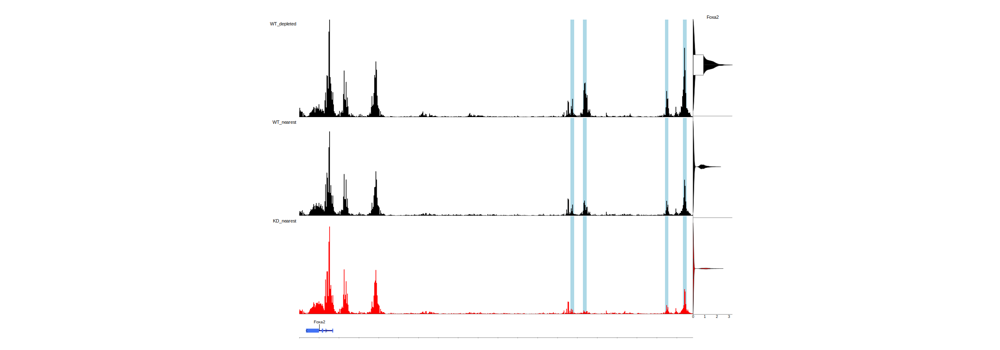

In [65]:
gene_list = 'Foxa2' #DEGS[order(logFC)][sign != 'nonsig'] %>% head(5) %>% .$gene

options(repr.plot.width = 20, repr.plot.height = 7)
plots = mclapply(gene_list, function(gene_in){
    peaks = links[gene %in% gene_in & peak %in% DARs$gene,]
    region = paste0(peaks$chr[1], ':', min(c(peaks$start, peaks$gene_strt)), '-', max(peaks$end, peaks$gene_end))

    if(length(peaks >= 1)){
        plot_browser_track(gene = gene_in, # Only choose one of gene/input_region, otherwise will use region
                                      input_region = region, #'chr10:101890817-101891317', 
                                      WT_plot, 
                                      plot_expression = T,
                                      sce = rna.sce_bw,
                                      extend.upstream = 1e3,
                                      extend.downstream = 1e3, 
                                      highlight_regions = peaks$peak,
                                      downsample.rate = 1, 
                                      no_label = F, 
                                      background_color = 'white',
                                      highlight_color = 'lightblue',
                                      bw_height = 50, 
                                      gene_height = 10, 
                                      bw_width = 200,
                                      expr_width = 20)
    }
}, mc.cores =42)
plots

# Figures!

In [534]:
KD_RNA = fread(sprintf('%s/celltype_DEGs_nPS_nPS_KD_WT_edgeR.txt.gz', args$outdir))
WT_RNA = fread(sprintf('%s/celltype_DEGs_EOdPS_nPS_WTonly_edgeR.txt.gz', args$outdir))

In [299]:
merge = merge(KD_RNA %>%
                    .[, .(gene, logFC, padj_fdr)] %>% 
                    setnames(c('logFC', 'padj_fdr'), c('logFC_KD', 'padj_fdr_KD')),
                WT_RNA %>%
                    .[, .(gene, logFC, padj_fdr)] %>% 
                    setnames(c('logFC', 'padj_fdr'), c('logFC_WT', 'padj_fdr_WT')),
              by = 'gene', all = T)

merge[, c(2,4)][is.na(merge[, c(2,4)])] <- 0
merge[, c(3,5)][is.na(merge[, c(3,5)])] <- 1

merge = merge %>% 
                .[, minFDR := pmin(padj_fdr_KD, padj_fdr_WT)] %>% 
                .[, maxFDR := pmax(padj_fdr_KD, padj_fdr_WT)] %>% 
                .[, meanlogFC := rowMeans(abs(.SD), na.rm = TRUE), .SDcols = c("logFC_KD", "logFC_WT")]



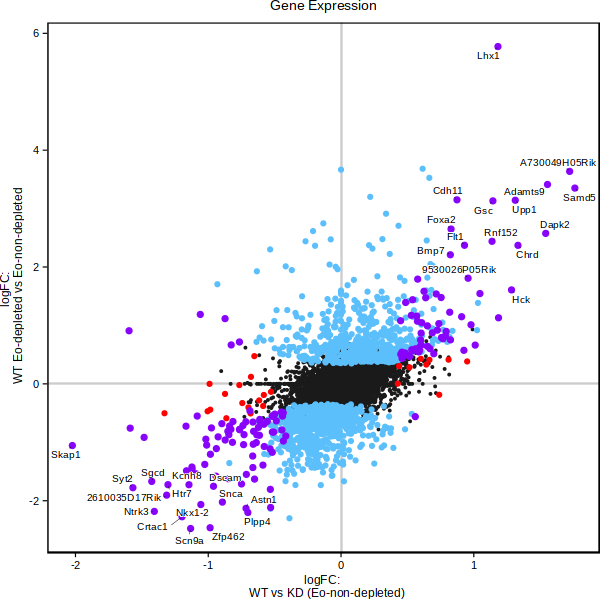

In [300]:
to.plot = merge %>% 
    .[, sig := ifelse(maxFDR < 0.05, 'Double',
                      ifelse(padj_fdr_WT <= 0.05 & padj_fdr_KD > 0.05, 'WT_only',
                             ifelse(padj_fdr_KD <= 0.05 & padj_fdr_WT > 0.05, 'KD_only', 'non_sig')))] %>% 
    .[, sig := factor(sig, levels=rev(c('Double', 'KD_only', 'WT_only', 'non_sig')))] %>%
    .[order(sig)]
to.plot_RNA = to.plot
options(repr.plot.width = 5, repr.plot.height = 5)

p1 = ggplot(to.plot, aes(logFC_KD, logFC_WT, color = sig)) + 
    geom_hline(yintercept = 0, color = 'grey80') + 
    geom_vline(xintercept = 0, color = 'grey80') + 
    geom_point(aes(size = sig)) + 
    ggrepel::geom_text_repel(data = head(merge[sig == 'Double'][order(-meanlogFC)], 30), 
                             aes(label = gene),
                             color = 'black',
                                size = 6 * 0.35,
                                box.padding = 0.15,
                                bg.color='white', 
                                bg.r = 0.1,
                                min.segment.length = 0,
                                segment.size = unit(0.1, 'mm')) + 
    scale_color_manual(values = c('Double' = '#8803fc', 
                                  'KD_only' = 'red', 
                                  'WT_only' = '#5bbffc', 
                                  'non_sig' = 'grey10')) + 
    scale_size_manual(values = c('Double' = 1, 
                                  'KD_only' = 0.7, 
                                  'WT_only' = 0.7, 
                                  'non_sig' = 0.05)) +
    # coord_fixed(ratio = 1) +
    ggtitle('Gene Expression') + 
    xlab('logFC: \n  WT vs KD (Eo-non-depleted)') + ylab('logFC: \n WT Eo-depleted vs Eo-non-depleted') + 
    theme_bw() + 
    theme(panel.grid = element_blank(),
            legend.position = 'none',
            axis.text = element_text(size = 6, color='black'),
            plot.title = element_text(size = 8, hjust = 0.5),
            axis.title = element_text(size = 7),
            text=element_text(size=6),
            panel.border = element_rect(color='black', linewidth=0.5, fill = NA),
            panel.background = element_blank(),
            axis.line = element_blank(),
            axis.ticks = element_line(linewidth=0.25, color = 'black'),
            plot.margin = margin(0, 0, 0, 0))
p1

In [626]:
GO_plot = function(plot){
    ggplot(plot, 
           aes(enrichment, Term, color = -log10(FDR), fill = -log10(FDR), size = DE)) +  #, 
        geom_bar(stat = 'identity', aes(fill = -log10(FDR)), color = NA,  width = 0.05) +
        geom_point() + 
        geom_text(aes(x = max(plot$enrichment)/100, label = Term), vjust = -0.5, hjust = 0, color = 'black', size = 5 * 0.35) + 
        guides(fill = guide_colourbar(
             barwidth = 0.5, barheight = 2.5,
            frame.colour = "black", 
            ticks.colour = "black"
        )) + 
        scale_size(range = c(0, 1)) + 
        scale_fill_gradientn(colors = c('white', 'blue', 'red'), limits = c(0, max(-log10(plot$FDR))), name = '-log10(FDR)') + 
        scale_color_gradientn(colors = c('white', 'blue', 'red'), limits = c(0, max(-log10(plot$FDR))), name = '-log10(FDR)') + 
        scale_x_continuous(limits = c(0, max(plot$enrichment)), expand = c(0,0,0,3)) + 
        scale_y_discrete(expand = c(0,0.3,0,1.5)) + 
        theme_bw() + 
        theme(axis.text = element_text(size = 5, color = 'black'),
                axis.text.y = element_blank(), 
                axis.ticks.y = element_blank(),
                axis.title.x = element_text(size = 7),
                axis.title.y = element_blank(),
                panel.border = element_rect(color='black', linewidth=0.5, fill = NA),
                panel.background = element_rect(fill = 'white'),
                panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
             #   plot.margin = margin(0, 0, 0, 0),  # Adjust the margin around the plot
                # legend.margin = margin(0, 0, 0, 0),  # Adjust the margin inside the legend box
                # legend.box.margin = margin(0, 0, 0, 0),  # Adjust the margin outside the legend box
                legend.key.size  = unit(1, "mm"),
                legend.key = element_blank(),
                legend.position = 'right')
}



In [627]:
genes = KD_RNA[sign == 'pos', gene]
tmp = do_GO(genes, background = rownames(rna.sce))
p1 = GO_plot(tmp[[1]] %>% copy() %>%
           .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 20 & N < 1000 & DE > 3 & enrichment > 3] %>% .[order(FDR)] %>% 
           # .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 50 & N < 1000 & DE > 3 & enrichment > 5] %>% .[order(FDR)] %>% 
            .[,Term := factor(Term, levels = rev(Term))] %>% 
            .[, enrichment := ifelse(enrichment > 100, 100, enrichment)] %>% 
            head(7)
)

genes = KD_RNA[sign == 'neg', gene]
tmp = do_GO(genes, background = rownames(rna.sce))
p2 = GO_plot(tmp[[1]] %>% copy() %>%
           .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 10 & N < 1000 & DE > 3 & enrichment > 3] %>% .[order(FDR)] %>% 
           # .[FDR < 0.05] %>% .[Ont == 'BP'] %>% .[N > 50 & N < 1000 & DE > 3 & enrichment > 5] %>% .[order(FDR)] %>% 
            .[,Term := factor(Term, levels = rev(Term))] %>% 
            .[, enrichment := ifelse(enrichment > 100, 100, enrichment)] %>% 
            head(30) %>%
           .[grep('actin|adhesion|growth', Term)] %>%
            head(7)
)


'select()' returned 1:many mapping between keys and columns

'select()' returned 1:many mapping between keys and columns



In [628]:
ggsave(ggarrange(p1, p2, align = 'hv', nrow = 2, common.legend = T, legend = 'right'), 
       file = file.path(args$outdir, 'KD_RNA_GO.pdf'), 
        width = 90, 
        height = 65, 
       units = "mm")

In [382]:
KD_ATAC = fread(sprintf('%s/celltype_DARs_nPS_nPS_KD_WT_edgeR.txt.gz', args$outdir))
WT_ATAC = fread(sprintf('%s/celltype_DARs_EOdPS_nPS_WTonly_edgeR.txt.gz', args$outdir))

In [383]:
merge = merge(KD_ATAC %>%
                    .[, .(gene, logFC, padj_fdr)] %>% 
                    setnames(c('logFC', 'padj_fdr'), c('logFC_KD', 'padj_fdr_KD')),
                WT_ATAC %>%
                    .[, .(gene, logFC, padj_fdr)] %>% 
                    setnames(c('logFC', 'padj_fdr'), c('logFC_WT', 'padj_fdr_WT')),
              by = 'gene', all = T)

merge[, c(2,4)][is.na(merge[, c(2,4)])] <- 0
merge[, c(3,5)][is.na(merge[, c(3,5)])] <- 1

merge = merge %>% 
                .[, minFDR := pmin(padj_fdr_KD, padj_fdr_WT)] %>% 
                .[, maxFDR := pmax(padj_fdr_KD, padj_fdr_WT)] %>% 
                .[, meanlogFC := rowMeans(abs(.SD), na.rm = TRUE), .SDcols = c("logFC_KD", "logFC_WT")]



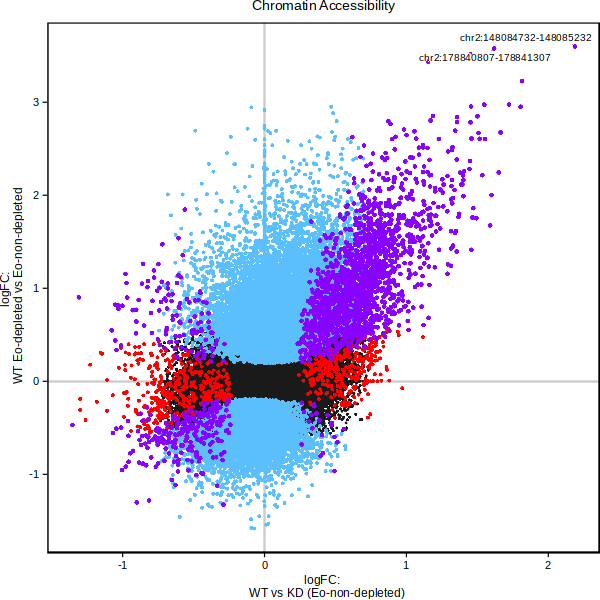

In [384]:
to.plot = merge %>% 
    .[, sig := ifelse(maxFDR < 0.05, 'Double',
                      ifelse(padj_fdr_WT <= 0.05 & padj_fdr_KD > 0.05, 'WT_only',
                             ifelse(padj_fdr_KD <= 0.05 & padj_fdr_WT > 0.05, 'KD_only', 'non_sig')))] %>% 
    .[, sig := factor(sig, levels=rev(c('Double', 'KD_only', 'WT_only', 'non_sig')))] %>%
    .[order(sig)]
to.plot_ATAC = to.plot
options(repr.plot.width = 5, repr.plot.height = 5)

p2 = ggplot(to.plot, aes(logFC_KD, logFC_WT, color = sig)) + 
    geom_hline(yintercept = 0, color = 'grey80') + 
    geom_vline(xintercept = 0, color = 'grey80') + 
    ggrastr::rasterise(dpi = 900, geom_point(aes(size = sig))) + 
    ggrepel::geom_text_repel(data = head(merge[sig == 'Double'][order(-meanlogFC)], 2), 
                             aes(label = gene),
                             color = 'black',
                                size = 6 * 0.35,
                                box.padding = 0.15,
                                bg.color='white', 
                                bg.r = 0.1,
                                min.segment.length = 0,
                                segment.size = unit(0.1, 'mm')) + 
    scale_color_manual(values = c('Double' = '#8803fc', 
                                  'KD_only' = 'red', 
                                  'WT_only' = '#5bbffc', 
                                  'non_sig' = 'grey10')) + 
    scale_size_manual(values = c('Double' = 0.5, 
                                  'KD_only' = 0.3, 
                                  'WT_only' = 0.3, 
                                  'non_sig' = 0.05)) +
    # coord_fixed(ratio = 1) +
    ggtitle('Chromatin Accessibility') + 
    xlab('logFC: \n  WT vs KD (Eo-non-depleted)') + ylab('logFC: \n WT Eo-depleted vs Eo-non-depleted') + 
    theme_bw() + 
    theme(panel.grid = element_blank(),
            legend.position = 'none',
            axis.text = element_text(size = 6, color='black'),
            plot.title = element_text(size = 8, hjust = 0.5),
            axis.title = element_text(size = 7),
            text=element_text(size=6),
            panel.border = element_rect(color='black', linewidth=0.5, fill = NA),
            panel.background = element_blank(),
            axis.line = element_blank(),
            axis.ticks = element_line(linewidth=0.25, color = 'black'),
            plot.margin = margin(0, 0, 0, 0))
p2

In [311]:
ggsave(ggarrange(p1, p2, align = 'hv'), 
       file = file.path(args$outdir, 'WT_KD_comparison_ATAC_RNA.pdf'), 
        width = 170, 
        height = 60, 
       units = "mm")

Warning message:
“ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


In [504]:
motif_enrichment = function(peaks, title = ''){
    tmp = as.data.table(ArchR:::.computeEnrichment(matches, peaks, seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

    to.plot = tmp[order(-mlog10Padj)] %>% .[,I := .I]
    p = ggplot(head(to.plot, 50), aes(I, mlog10Padj)) + # , color = Enrichment 
        geom_point(size = 0.5) + 
        ggrepel::geom_text_repel(data = head(to.plot,10),  
                                 aes(label = feature),
                                 color = 'black',
                                size = 6 * 0.35,
                                box.padding = 0.15,
                                bg.color='white', 
                                bg.r = 0.1,
                                min.segment.length = 0,
                                     nudge_x = 1,
  #  segment.curvature = -0.1,
    segment.ncp = 3,
    segment.angle = 20,
                                segment.size = unit(0.1, 'mm')) + 
        # ggtitle(title) +
        theme_bw() + 
        theme(axis.title = element_blank(),
                axis.text.x = element_blank(),
                panel.grid = element_blank(),
                legend.position = 'none',
                axis.text = element_text(size = 6, color='black'),
                plot.title = element_text(size = 8, hjust = 0.5),
                text=element_text(size=6),
                panel.border = element_rect(color='black', linewidth=0.5, fill = NA),
                panel.background = element_blank(),
                axis.line = element_blank(),
                axis.ticks = element_line(linewidth=0.25, color = 'black'),
                plot.margin = margin(0, 0, 0, 0))
    return(p)
}

In [505]:
p1 = motif_enrichment(WT_ATAC[logFC > 0 & padj_fdr < 5e-2, gene], title = 'test')
p2 = motif_enrichment(WT_ATAC[logFC < 0 & padj_fdr < 5e-2, gene], title = 'test')
p3 = motif_enrichment(KD_ATAC[logFC > 0 & padj_fdr < 5e-2, gene], title = 'test')
p4 = motif_enrichment(KD_ATAC[logFC < 0 & padj_fdr < 5e-2, gene], title = 'test')
p5 = motif_enrichment(to.plot_ATAC[sig == 'Double'][logFC_KD > 0 & logFC_WT > 0, gene], title = 'test')
p6 = motif_enrichment(to.plot_ATAC[sig == 'Double'][logFC_KD < 0 & logFC_WT < 0, gene], title = 'test')


In [514]:
library(chromVARmotifs)
library(ggseqlogo)
data("mouse_pwms_v2")
motifs <- mouse_pwms_v2
obj <- ArchR:::.summarizeChromVARMotifs(motifs)
motifs <- obj$motifs
motifSummary <- obj$motifSummary

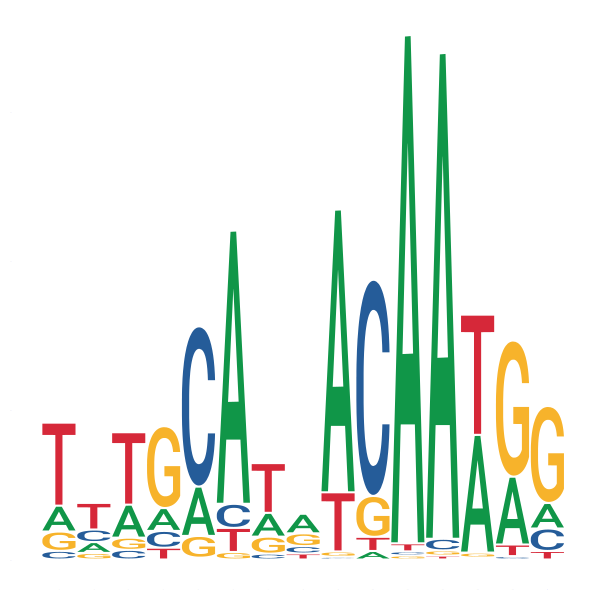

In [530]:
ggseqlogo(exp(motifs$Sox2_750@profileMatrix)) + theme(axis.title = element_blank(),
                                                       text = element_text(size = 0))

In [400]:
tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, WT_ATAC[logFC > 0 & padj_fdr < 5e-2, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
p1 = ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, WT_ATAC[logFC < 0 & padj_fdr < 5e-2, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
p2 = ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, KD_ATAC[logFC > 0 & padj_fdr < 5e-2, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
p3 = ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, KD_ATAC[logFC < 0 & padj_fdr < 5e-2, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
p4 = ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, to.plot_ATAC[sig == 'Double'][logFC_KD > 0 & logFC_WT > 0, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
p5 = ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

tmp2 = as.data.table(ArchR:::.computeEnrichment(matches, to.plot_ATAC[sig == 'Double'][logFC_KD < 0 & logFC_WT < 0, gene], seq_len(nrow(matches)))) %>%
        .[,feature := str_split(feature, '_') %>% map_chr(1)] %>% 
        .[mlog10Padj > -log10(0.05)]

to.plot = tmp2[order(-mlog10Padj)] %>% .[,I := .I]
p6 = ggplot(head(to.plot, 50), aes(I, mlog10Padj, color = Enrichment)) + 
    geom_point() + 
    ggrepel::geom_text_repel(data = head(to.plot,10), aes(label = feature), color = 'black') + 
    theme_bw()

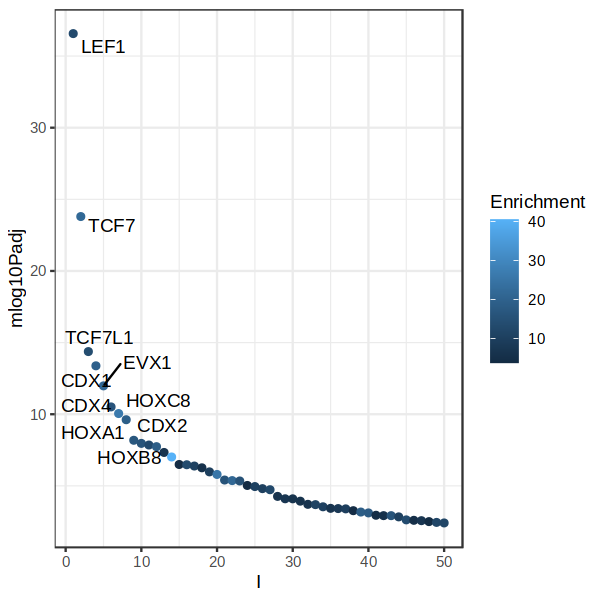

In [403]:
p6

In [401]:
plot = ggarrange(plotlist = list(p1, p4, p2, p5, p3, p6), align = 'h')

In [402]:
plot

Warning message:
“ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


ERROR: Error in grid.Call(C_convert, x, as.integer(whatfrom), as.integer(whatto), : Viewport has zero dimension(s)


plot without title

In [378]:
plot_region = function(gene_in, no_label = F, extend.upstream = 1e3, extend.downstream = 1e3){
    peaks = combind_sig[gene %in% gene_in,]
    region = paste0(peaks$chr[1], ':', min(c(peaks$start, peaks$gene_strt)) - extend.downstream, '-', max(peaks$end, peaks$gene_end) + extend.upstream)
    
    # Highlight colors
    highlight_colors = ifelse(peaks$ATAC_sig == 'Double', "#b8fca4", 
                              ifelse(peaks$ATAC_sig == 'KD_only', "#80fff9",
                                    'grey90'))
    names(highlight_colors) = str_split(str_split(peaks[, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)
    
    
    if(length(nrow(peaks) >= 1)){
        plot_browser_track(gene = gene_in, # Only choose one of gene/input_region, otherwise will use region
                                      input_region = region, #'chr10:101890817-101891317', 
                                      WT_plot, 
                                      plot_expression = T,
                                      sce = rna.sce_bw,
                                      extend.upstream = 0,
                                      extend.downstream = 0, 
                                      highlight_regions = peaks$peak,
                                      downsample.rate = 1, 
                                      no_label = no_label, 
                                      background_color = 'white',
                                      highlight_color = highlight_colors,
                                      bw_height = 10, #7, 
                                      gene_height = 6, 
                                      bw_width = 45, #30,
                                      expr_width = 5)
    }
}

In [375]:
combind_sig = combined %>% .[RNA_sig != 'non_sig' & ATAC_sig != 'non_sig'] %>%
                .[, minATACFDR := pmin(ATAC_padj_fdr_KD, ATAC_padj_fdr_WT)] %>% 
                .[, minRNAFDR := pmin(RNA_padj_fdr_KD, RNA_padj_fdr_WT)] %>%
                .[, maxATAClogFC:= pmin(ATAC_logFC_KD, ATAC_logFC_WT)] %>% 
                .[, maxRNAlogFC := pmin(RNA_logFC_KD, RNA_logFC_WT)]


In [379]:
p1 = plot_region('Foxa2', extend.downstream = -6.6e4, extend.upstream = -1e4, no_label = F)
p2 = plot_region('Lhx1', extend.downstream = -1.3e5, extend.upstream = -6e4, no_label = T)
p3 = plot_region('Gsc', extend.downstream = -15*3*1e3, extend.upstream = -37*3*1e3, no_label = T)
p4 = plot_region('Chrd', extend.downstream = -37.5*3*1e3, extend.upstream = -32*3*1e3, no_label = F)
p5 = plot_region('Adamts9', extend.downstream = -15*3*1e3, extend.upstream = -30*3*1e3, no_label = T)
p6 = plot_region('Zfp462', extend.downstream = -53*3*1e3, extend.upstream = 3*3*1e3, no_label = T)



In [380]:
ggsave(file.path(args$outdir, 'genome_browser_tracks.pdf'), 
       plot = patchwork::wrap_plots(plotlist = list(p1, p2, p3, p4, p5, p6), 
                                      nrow = 2),
       width = 190, 
       height = 100, 
       units = "mm")

In [304]:
colnames(to.plot_ATAC)[2:length(to.plot_ATAC)] = paste0('ATAC_', colnames(to.plot_ATAC)[2:length(to.plot_ATAC)])
colnames(to.plot_RNA)[2:length(to.plot_RNA)] = paste0('RNA_', colnames(to.plot_RNA)[2:length(to.plot_RNA)])

In [168]:
# This filters out peaks that are not linked to any tested genes!
combined = merge(to.plot_RNA, links, by = 'gene') %>%
    merge(., to.plot_ATAC %>% setnames('gene', 'peak'), by = 'peak')

In [212]:
combind_sig = combined %>% .[RNA_sig == 'Double' & ATAC_sig != 'non_sig'] %>%
                .[, minATACFDR := pmin(ATAC_padj_fdr_KD, ATAC_padj_fdr_WT)] %>% 
                .[, minRNAFDR := pmin(RNA_padj_fdr_KD, RNA_padj_fdr_WT)] %>%
                .[, maxATAClogFC:= pmin(ATAC_logFC_KD, ATAC_logFC_WT)] %>% 
                .[, maxRNAlogFC := pmin(RNA_logFC_KD, RNA_logFC_WT)]


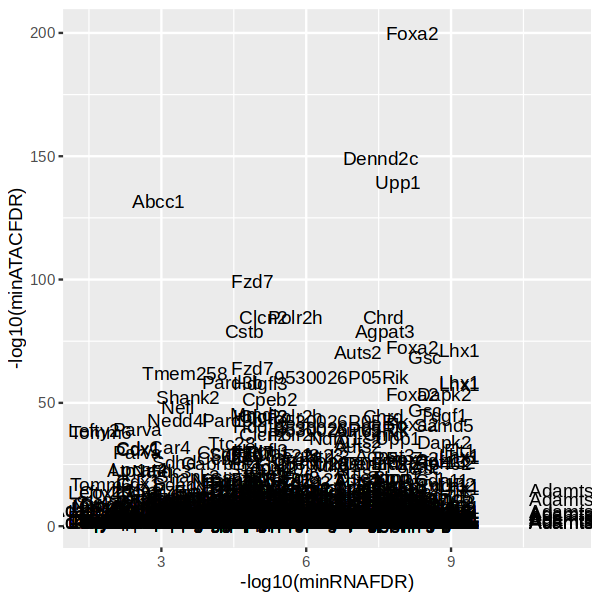

In [213]:
ggplot(combind_sig, aes(-log10(minRNAFDR), -log10(minATACFDR))) + 
    geom_text(aes(label=gene))

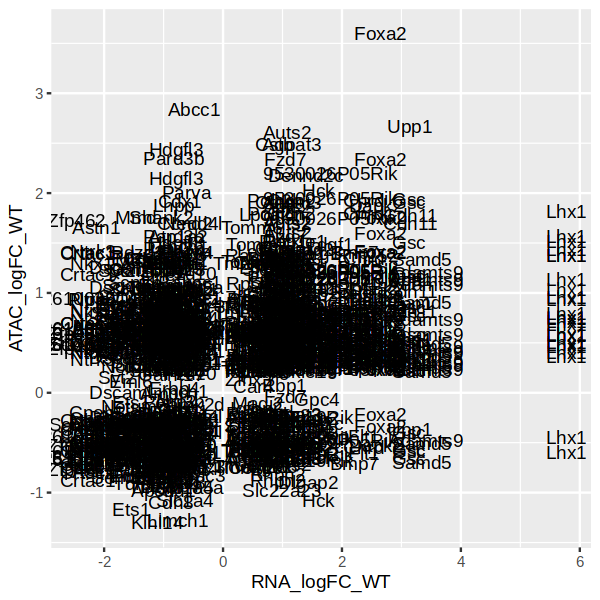

In [214]:
ggplot(combind_sig, aes(RNA_logFC_WT, ATAC_logFC_WT)) + 
    geom_text(aes(label=gene))

In [257]:
combind_sig = combined %>% .[RNA_sig %in% c('Double', 'KD_only') & ATAC_sig %in% c('Double', 'KD_only')] %>%
                .[, minATACFDR := pmin(ATAC_padj_fdr_KD, ATAC_padj_fdr_WT)] %>% 
                .[, minRNAFDR := pmin(RNA_padj_fdr_KD, RNA_padj_fdr_WT)] %>%
                .[, maxATAClogFC:= pmin(ATAC_logFC_KD, ATAC_logFC_WT)] %>% 
                .[, maxRNAlogFC := pmin(RNA_logFC_KD, RNA_logFC_WT)]


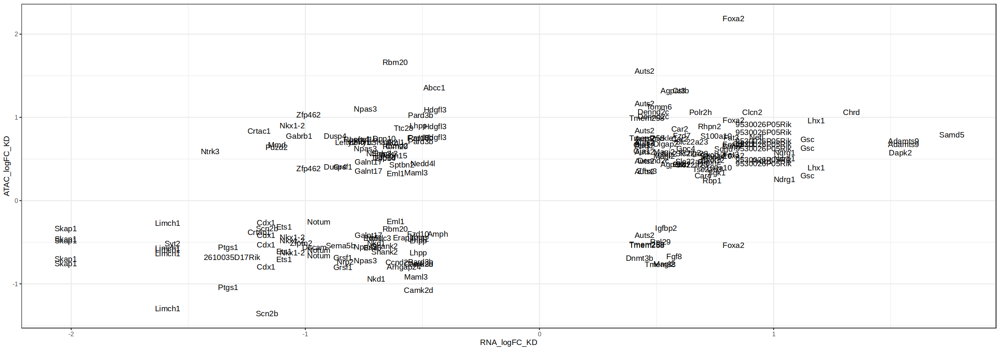

In [259]:
ggplot(combind_sig, aes(RNA_logFC_KD, ATAC_logFC_KD)) + 
    geom_text(aes(label=gene)) +
    theme_bw()

In [284]:
combind_sig = combined %>% .[RNA_sig != 'non_sig' & ATAC_sig != 'non_sig'] %>%
                .[, minATACFDR := pmin(ATAC_padj_fdr_KD, ATAC_padj_fdr_WT)] %>% 
                .[, minRNAFDR := pmin(RNA_padj_fdr_KD, RNA_padj_fdr_WT)] %>%
                .[, maxATAClogFC:= pmin(ATAC_logFC_KD, ATAC_logFC_WT)] %>% 
                .[, maxRNAlogFC := pmin(RNA_logFC_KD, RNA_logFC_WT)]


Warning message in Ops.factor(left, right):
“‘>=’ not meaningful for factors”
Warning message in Ops.factor(left, right):
“‘>=’ not meaningful for factors”


[[1]]


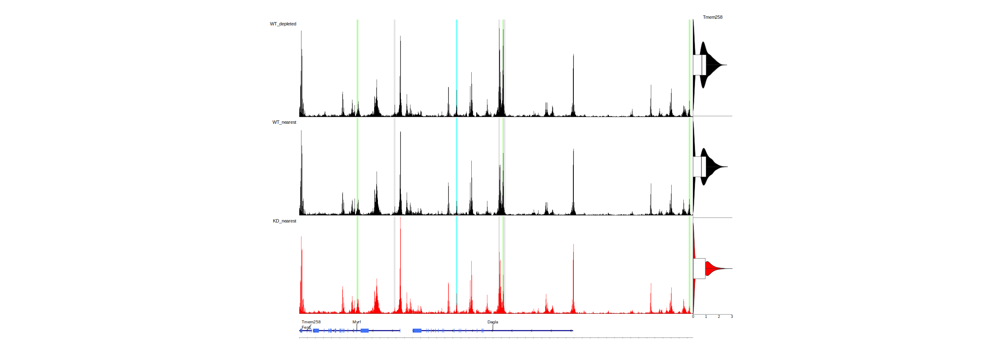

In [363]:
gene_list = c('Tmem258')

options(repr.plot.width = 20, repr.plot.height = 7)
plots = mclapply(gene_list, function(gene_in){
    peaks = combind_sig[gene %in% gene_in,]
    region = paste0(peaks$chr[1], ':', min(c(peaks$start, peaks$gene_strt)), '-', max(peaks$end, peaks$gene_end))

    
    # Highlight colors
    highlight_colors = ifelse(peaks$ATAC_sig == 'Double', "#b8fca4", 
                              ifelse(peaks$ATAC_sig == 'KD_only', "#80fff9",
                                    'grey90'))
    names(highlight_colors) = str_split(str_split(peaks[, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)
    
    
    if(length(nrow(peaks) >= 1)){
        plot_browser_track(gene = gene_in, # Only choose one of gene/input_region, otherwise will use region
                                      input_region = region, #'chr10:101890817-101891317', 
                                      WT_plot, 
                                      plot_expression = T,
                                      sce = rna.sce_bw,
                                      extend.upstream = 1e3,
                                      extend.downstream = 1e3, 
                                      highlight_regions = peaks$peak,
                                      downsample.rate = 1, 
                                      no_label = F, 
                                      background_color = 'white',
                                      highlight_color = highlight_colors,
                                      bw_height = 50, 
                                      gene_height = 10, 
                                      bw_width = 200,
                                      expr_width = 20)
    }
}, mc.cores =42)
plots

In [293]:
combind_sig = combined %>% .[RNA_sig %in% c('Double', 'KD_only') & ATAC_sig %in% c('Double', 'KD_only')] %>%
                .[, minATACFDR := pmin(ATAC_padj_fdr_KD, ATAC_padj_fdr_WT)] %>% 
                .[, minRNAFDR := pmin(RNA_padj_fdr_KD, RNA_padj_fdr_WT)] %>%
                .[, maxATAClogFC:= pmin(ATAC_logFC_KD, ATAC_logFC_WT)] %>% 
                .[, maxRNAlogFC := pmin(RNA_logFC_KD, RNA_logFC_WT)]


In [295]:
gene_list = c('Adamts9', 'Chrd', 'Lhx1', 'Gsc', 'Zfp462')

options(repr.plot.width = 20, repr.plot.height = 7)
plots = mclapply(gene_list, function(gene_in){
    peaks = combind_sig[gene %in% gene_in,]
    region = paste0(peaks$chr[1], ':', min(c(peaks$start, peaks$gene_strt)), '-', max(peaks$end, peaks$gene_end))

    
    # Highlight colors
    highlight_colors = ifelse(peaks$ATAC_sig == 'Double', "#b8fca4", 
                              ifelse(peaks$ATAC_sig == 'KD_only', "#80fff9",
                                    'grey90'))
    names(highlight_colors) = str_split(str_split(peaks[, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)
    
    
    if(length(nrow(peaks) >= 1)){
        plot_browser_track(gene = gene_in, # Only choose one of gene/input_region, otherwise will use region
                                      input_region = region, #'chr10:101890817-101891317', 
                                      WT_plot, 
                                      plot_expression = T,
                                      sce = rna.sce_bw,
                                      extend.upstream = 1e3,
                                      extend.downstream = 1e3, 
                                      highlight_regions = peaks$peak,
                                      downsample.rate = 1, 
                                      no_label = T, 
                                      background_color = 'white',
                                      highlight_color = highlight_colors,
                                      bw_height = 50, 
                                      gene_height = 10, 
                                      bw_width = 200,
                                      expr_width = 20)
    }
}, mc.cores =42)

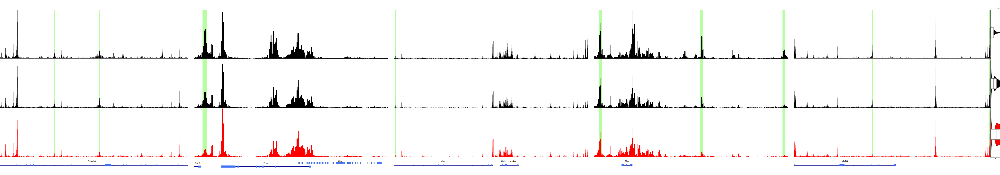

In [297]:
options(repr.plot.width = 40, repr.plot.height = 7)
ggarrange(plotlist = plots, align = 'hv', nrow = 1)

In [287]:
combind_sig = combined %>% .[RNA_sig %in% c('WT_only') & ATAC_sig %in% c('KD_only')] %>% # 'Double', 
                .[, minATACFDR := pmin(ATAC_padj_fdr_KD, ATAC_padj_fdr_WT)] %>% 
                .[, minRNAFDR := pmin(RNA_padj_fdr_KD, RNA_padj_fdr_WT)] %>%
                .[, maxATAClogFC:= pmin(ATAC_logFC_KD, ATAC_logFC_WT)] %>% 
                .[, maxRNAlogFC := pmin(RNA_logFC_KD, RNA_logFC_WT)]


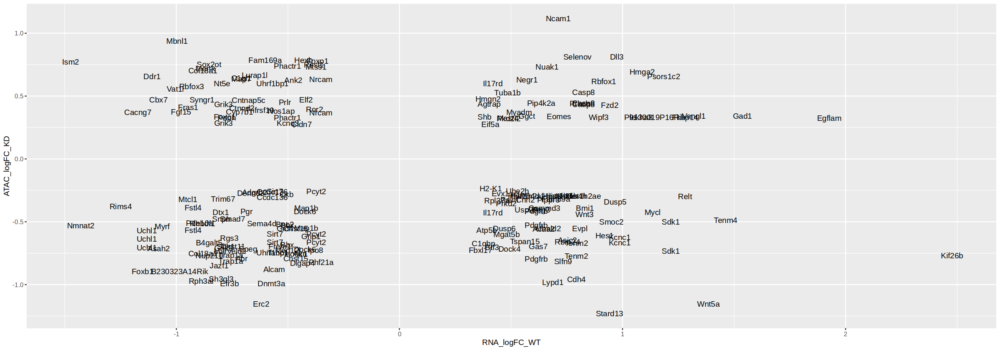

In [288]:
ggplot(combind_sig, aes(RNA_logFC_WT, ATAC_logFC_KD)) + 
    geom_text(aes(label=gene))

Warning message in mclapply(gene_list, function(gene_in) {:
“scheduled core 1 encountered error in user code, all values of the job will be affected”


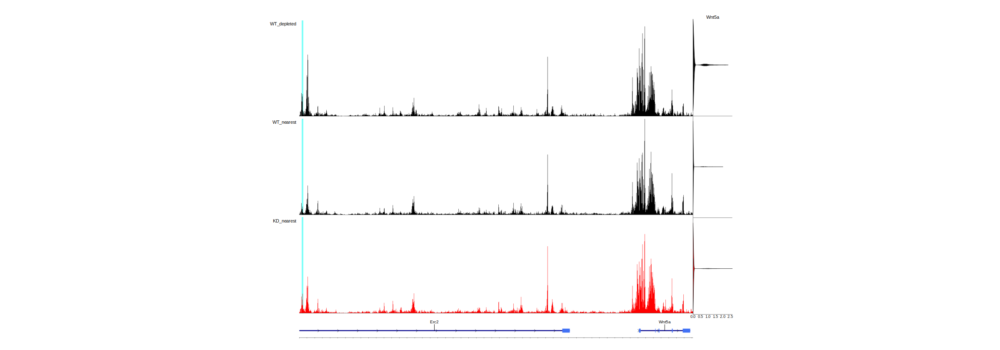

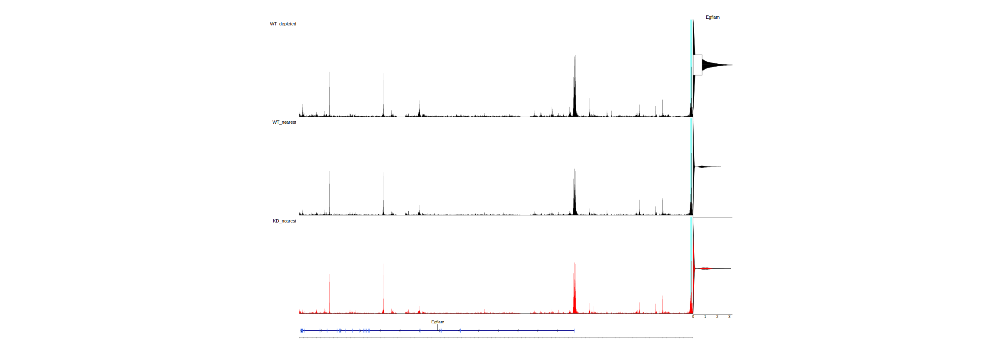

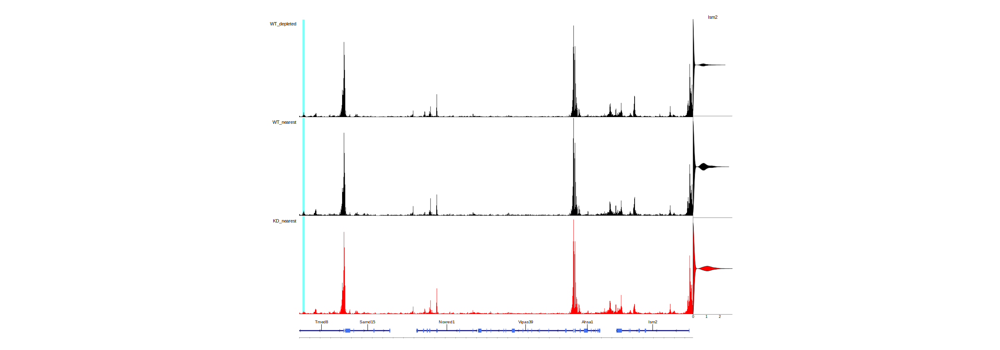

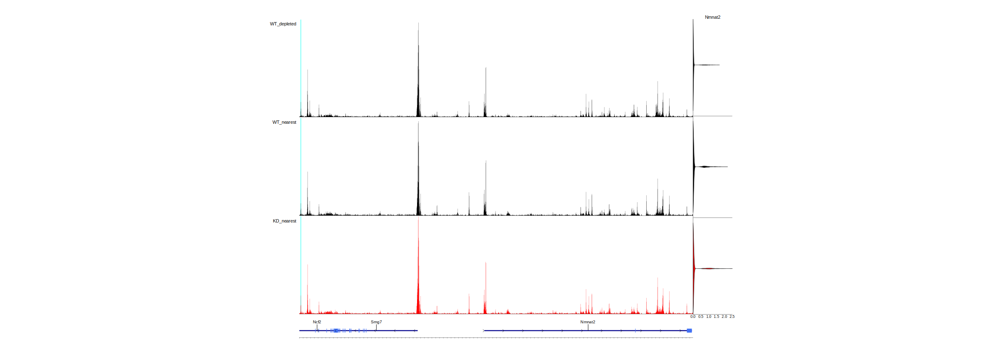

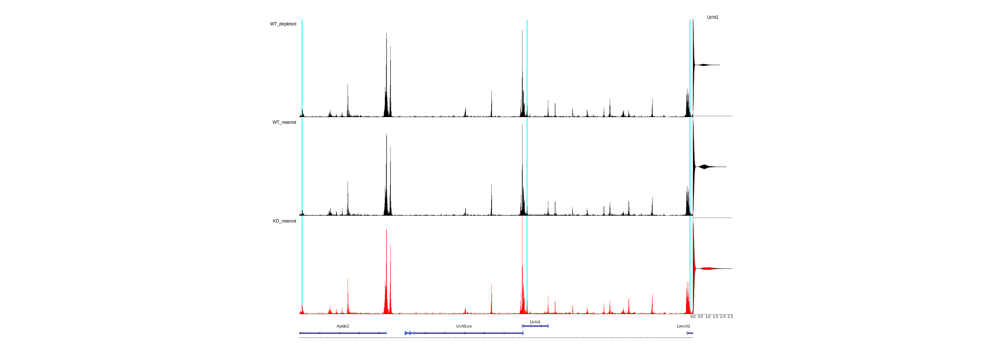

...

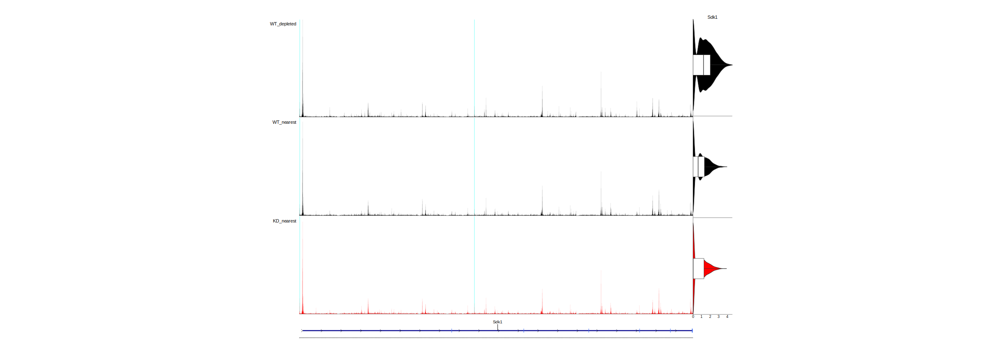

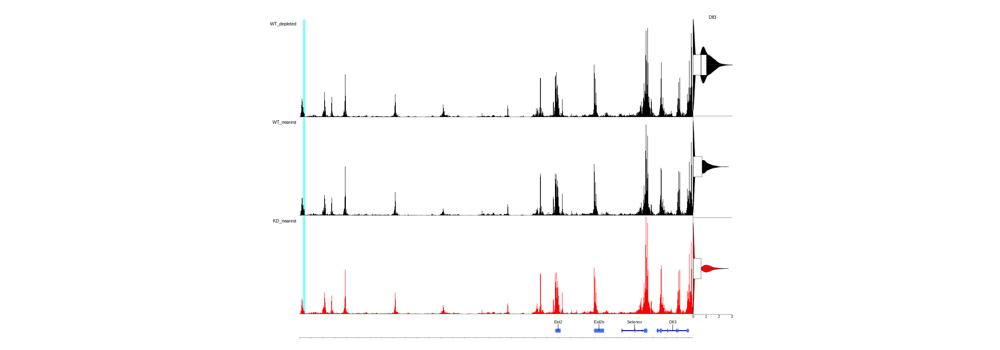

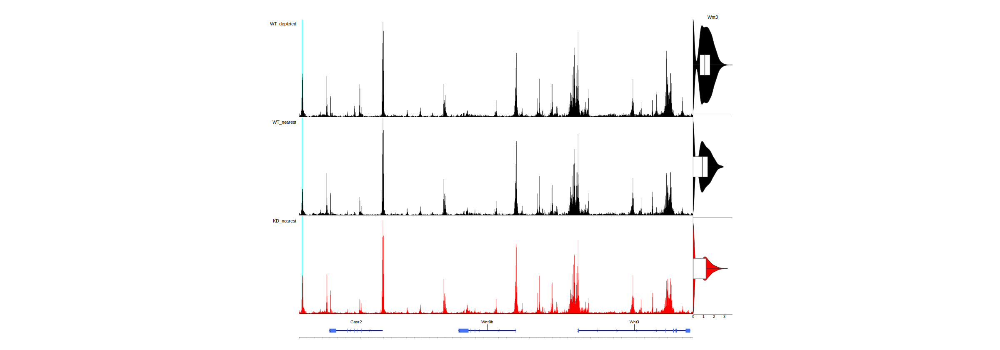

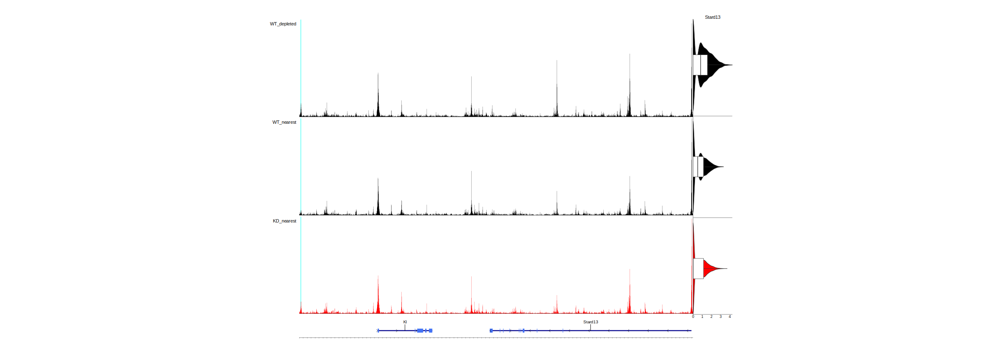

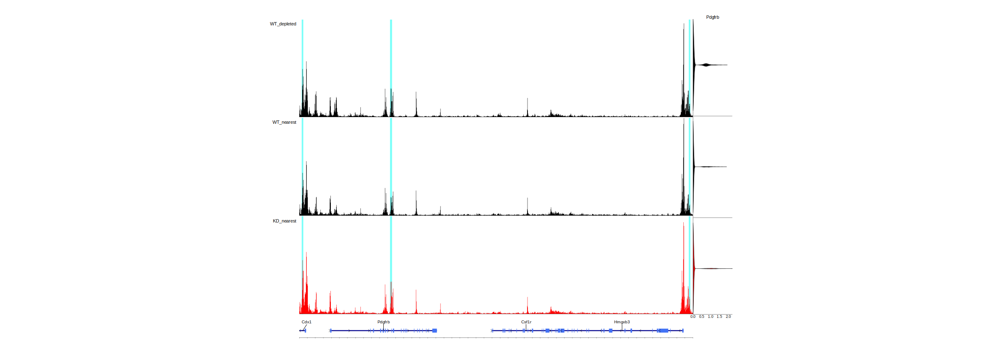

[[1]]
[1] "Error in matrix(value, nrow = nr, dimnames = list(rn, cn)) : \n  data is too long\n"
attr(,"class")
[1] "try-error"
attr(,"condition")
<simpleError in matrix(value, nrow = nr, dimnames = list(rn, cn)): data is too long>

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]


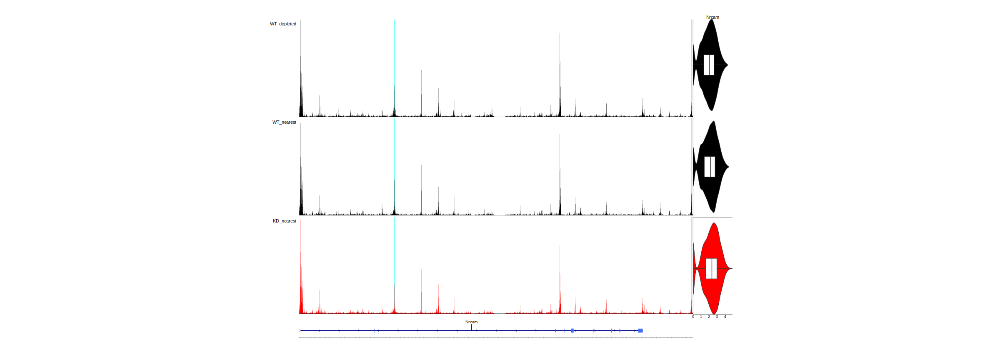

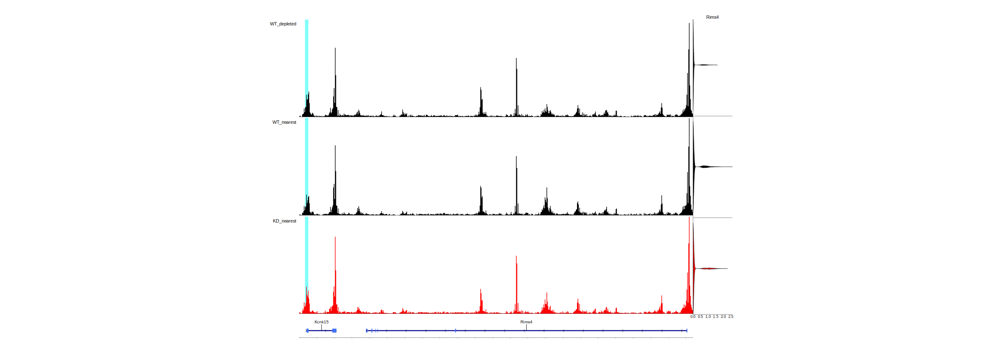

In [289]:
gene_list = c('Kit26b', 'Wnt5a', 'Egflam', 'Ism2', 'Nmnat2', 'Uchl1', 'Dnmt3a', 'Sdk1', 'Dll3', 'Wnt3', 'Stard13', 'Pdgfrb', 'Nrcam', 'Rims4')

options(repr.plot.width = 20, repr.plot.height = 7)
plots = mclapply(gene_list, function(gene_in){
    peaks = combind_sig[gene %in% gene_in,]
    region = paste0(peaks$chr[1], ':', min(c(peaks$start, peaks$gene_strt)), '-', max(peaks$end, peaks$gene_end))

    
    # Highlight colors
    highlight_colors = ifelse(peaks$ATAC_sig == 'Double', "#b8fca4", 
                              ifelse(peaks$ATAC_sig == 'KD_only', "#80fff9",
                                    'grey90'))
    names(highlight_colors) = str_split(str_split(peaks[, peak], ':') %>% map_chr(2), '-') %>% map_chr(1)
    
    
    if(length(peaks >= 1)){
        plot_browser_track(gene = gene_in, # Only choose one of gene/input_region, otherwise will use region
                                      input_region = region, #'chr10:101890817-101891317', 
                                      WT_plot, 
                                      plot_expression = T,
                                      sce = rna.sce_bw,
                                      extend.upstream = 1e3,
                                      extend.downstream = 1e3, 
                                      highlight_regions = peaks$peak,
                                      downsample.rate = 1, 
                                      no_label = F, 
                                      background_color = 'white',
                                      highlight_color = highlight_colors,
                                      bw_height = 50, 
                                      gene_height = 10, 
                                      bw_width = 200,
                                      expr_width = 20)
    }
}, mc.cores =42)
plots